#Setting up your environment

 This will guide you through a basic setup for an Ubuntu Linux deploy into Docker -> Colab.

#SECURITY:
- Do not run any notebooks for things that you do not trust.
- Through local connection setup; the notebook will be able to execute (read, write, delete) files on your local computer.
#- eg; commands such as "rm -rf/"
#!WILL RUN ON YOUR LOCAL COMPUTER!.

There are two options - the option for this is to run with GPU pulling from your local GPU.  If you are wanting to run from Colab's GPU, or you don't have the compute power, ignore these steps and select TPU from Colab.  



#Installation for GPU support on your desktop.

##NVIDIA CUDA Installation Guide for Linux:

https://docs.nvidia.com/cuda/cuda-installation-guide-linux/

- ensure you have:
  - CUDA-Capable GPU
  - Supported version of Linux with a gcc compiler and toolchain
  - CUDA Toolkit installed (next step)

  The following are commands to enter.  These commands you run from terminal *not from inside colab*.  

  


1. Verify you have CUDA Capable GPU

  If you have one GPU:

   `lspci | grep -i nvidia`
  If you have multiple GPU:

  `lspci | grep ' VGA ' | cut -d" " -f 1 | xargs -i lspci -v -s {}`

  Grab the output; the ID shown isn't the name of the graphics card.  Look up the number you have in this table for the name of your GPU: *(assuming you do not know it).*
  https://download.nvidia.com/XFree86/Linux-x86_64/535.98/README/supportedchips.html
  *(Tip - it will be on the right, and then refer to the item on the left).*
  
  Then look up the name in the following table to see if your GPU is supported in the following, and what the Compute Capability is.

  https://developer.nvidia.com/cuda-gpus

  *(Tip - you need to click on the icon of the item listed from your grep.  It will drop down to show you if it is compute compatable).*

  If you are not listed; check you are not a legacy product here:
  https://developer.nvidia.com/cuda-legacy-gpus

  If you do not see anything; update the PCI hardware ->
  `update-pciids` (generally found in `/sbin`); then run the previous command again.

  

2. Verify you have a supported Linux Version.

  If you do not know your details; type the following:

    `uname -m && cat /etc/*release`

  Check in the CUDA Toolkit Release notes;
  (Current - https://docs.nvidia.com/cuda/cuda-toolkit-release-notes/index.html but you should check if it is latest when you run this).

  3. Verify GCC installed

  `gcc --version`

  If you do not have any (error result) you will need to install this.


4. Kernel Headers and Dev packages installed

  `uname -r`

  *(Tip; if you update your Kernel, you need to run this and subsequent again).

  

  5. Install GPUDirect storage
  *NB - this is only available for ->

    Ubuntu 20.04, Ubuntu 22.04, Ubuntu 24.04

    RHEL 8.y (y <= 10), RHEL 9.y (y <= 4)

  Why do I want this?   enable a direct data path for direct mem access (DMA) between GPU mem and storage; avoids bounce buffer through CPU.

  https://docs.nvidia.com/gpudirect-storage/troubleshooting-guide/index.html#mofed-req-install
  

  6. Download NVIDIA Toolkit

  Select the version for your system:
  https://developer.nvidia.com/cuda-downloads


 -  `wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/cuda-keyring_1.1-1_all.deb`
  
 - `sudo dpkg -i cuda-keyring_1.1-1_all.deb`
  
 - `sudo apt-get update`
  
 - `sudo apt-get -y install cuda-toolkit-12-6`

Install Driver - choose open kern (1) or legacy (2)

  1. `sudo apt-get install -y nvidia-open`
  2. `sudo apt-get install -y cuda-drivers`

To switch -> follow here: https://docs.nvidia.com/cuda/cuda-installation-guide-linux/#switching-between-driver-module-flavors


  7. Package manager install
  refer here: https://docs.nvidia.com/cuda/cuda-installation-guide-linux/#overview

  

You will need to choose to do Option 1 or 2 below; then continue on.

Option 1:
Start a Docker image:
Install Docker image or mirror to your loc:

`docker run --gpus=all -p 127.0.0.1:9000:8080 us-docker.pkg.dev/colab-images/public/runtime`

or

`docker run --gpus=all -p 127.0.0.1:9000:8080 asia-docker.pkg.dev/colab-images/public/runtime`

or

`docker run --gpus=all -p 127.0.0.1:9000:8080 europe-docker.pkg.dev/colab-images/public/runtime`

(NB: This can be run from Jupyter instead; but this is what I prefer).

Option 2:
Alternatively; if you want to run from a Jupyter notebook, after install jupyter, run through this:


```
  jupyter notebook \
    --NotebookApp.allow_origin='https://colab.research.google.com' \
    --port=8888 \
    --NotebookApp.port_retries=0
```

NB: You need to flag to trust WebSocket connections.



 Browser-specific settings

Note: If you're using Mozilla Firefox, you'll need to set thenetwork.websocket.allowInsecureFromHTTPS preference within the Firefox config editor. Colab makes a connection to your local kernel using a WebSocket. By default, Firefox disallows connections from HTTPS domains using standard WebSockets.

To do this; you need to go to mozilla, open about:config, search for the above and set it to 'true' (default is false).  

Whether you did option 1 or 2; you will need to grab the keys and token from the output of your terminal to:
* Open it in a browser
* Paste this into Google Colab.

Copy the output (link and token / keys and token).

Go back to Google Colab.  Select Local Runtime.



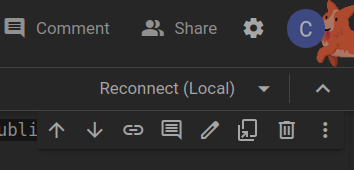

Select the down arrow and this following will pop up.  You need to paste the link you copied into the below where is specifies 'Please enter a valid backend URL'.  Click 'Connect'.

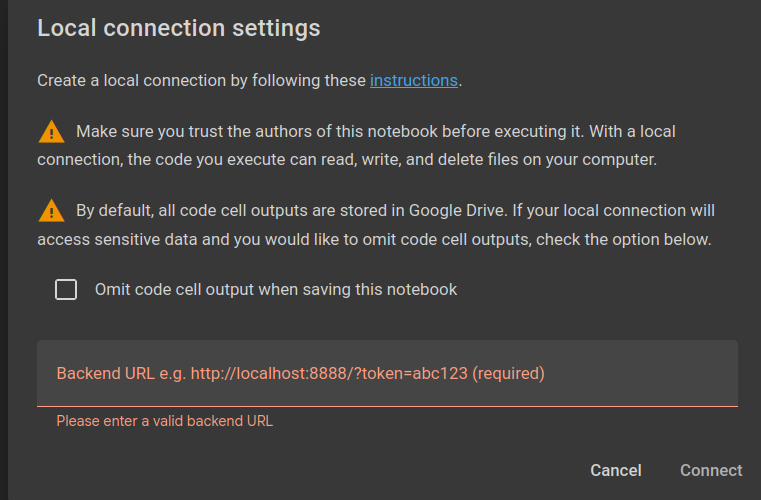

It will now run as your local GPU.

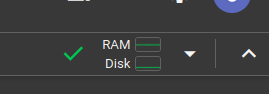

Check by selecting resources (or running the below commands).

You will need to follow the below steps to ensure it is set to GPU.  If you find it isn't; you will need to go to the Runtime type and select GPU to switch on the notebook to GPU. (This will restart a few times for the above steps).  You will need to check that GPU is enabled by running the scripts below.

# Pip install the below

!pip install pyclustering

!pip install pyclustering

!pip install Pillow

!pip install keras-tuner

!pip install os

!pip install ucimlrepo  


#Set up all libraries, import them here.

In [1]:
#  Import libraries.
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings

from scipy import stats

from pandas.plotting import scatter_matrix

from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.utils import plot_model

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split

from pyclustering.cluster import cluster_visualizer_multidim
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.cluster.elbow import elbow

from datetime import datetime

from zlib import crc32

from ucimlrepo import fetch_ucirepo  # Import the datset.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyclustering: filename=pyclustering-0.10.1.2-py3-none-any.whl size=2395100 sha256=3ea21aaf081f7457656c8505624b6c45535b411fe73001a15a6f40424612dbc3
  Stored in directory: /root/.cache/pip/wheels/b5/42/97/11eee99f5c1e4fdfc170f0a54f9c9eb195df66edb4cf69f449
Successfully built pyclustering
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.1 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os


The below is used to check versions of installed items.  There are conflicts in certain versions with Linux and using your local GPU so this will assist in troubleshooting.

NB:  When you run local vs when you run from Colab, you will see different versions of installed depending on if you have altered your local settings to specific versions.

In [3]:
#  Check that everything is set up correctly, and version of installed items.
print("===============================")
print("-------------------------------")
print("Version of Tensorflow: ", tf.__version__)
print("Version of Numpy: ", np.__version__)
print("Version of Pandas: ", pd.__version__)
print("-------------------------------")
print("===============================")

-------------------------------
Version of Tensorflow:  2.15.0
Version of Numpy:  1.25.2
Version of Pandas:  2.0.3
-------------------------------


#This will tell if you are using a GPU.  If you are not, it will error / have no GPU there.  

If you have no GPU, you can still run your notebook - it will just be slow. :|

Steps: Either connect to Colab and use thiers or go back to the initial steps and debug.  
Of note - you do need to select GPU in notebook settings.
Colab defaults to what you used last - so if you had previously run out of Colab GPU and switched to CPU, it will default to that when you set up local

#Example error below

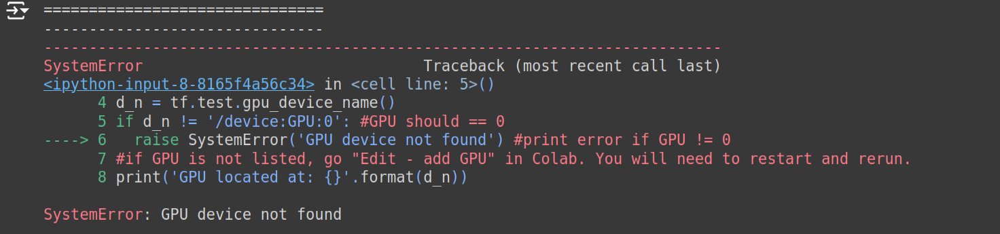

In [4]:
# Check if there is a GPU
print("===============================")
print("-------------------------------")
d_n = tf.test.gpu_device_name()
if d_n != '/device:GPU:0':  # GPU should == 0
    raise SystemError('GPU device not found')
# Print error if GPU != 0
# If GPU is not listed, go "Edit - add GPU" in Colab.
# You will need to restart and rerun.
print('GPU located at: {}'.format(d_n))
print("GPU located at : ", tf.test.gpu_device_name())
print("# of GPUs : ", len(tf.config.experimental.list_physical_devices('GPU')))
print("-------------------------------")
print("===============================")

-------------------------------
GPU located at: /device:GPU:0
GPU located at :  /device:GPU:0
# of GPUs :  1
-------------------------------


If this displays correctly with 1 GPU - you have successfully completed these steps!

In [5]:
# @title Define all functions here

def pltcolor(int_list):
    """Function to apply colours for plot

    Args:
        int_list (int[]): colour for plots

    Returns:
        colour_list (str[]): list of string
    """
    colour_list = []
    for line in int_list:
        if line == 0:
            colour_list.append('pink')
        elif line == 1:
            colour_list.append('purple')
        else:
            colour_list.append('green')
    return colour_list


def test_set_check(ident, test_r):
    """Function to calculate a checksum

    Args:
        ident (int64): identifier
        test_r (int): test ratio

    Returns:
        checksum (int): checksum
    """
    return crc32(np.int64(ident)) & 0xffffffff < test_r * 2**32

def split_tt_by_id(data, test_r, id_col):
    """Function to set split testing and training by the id created

    Args:
        data (dataframe): dataframe
        test_r (int): test ratio
        id_col (int): id array key

    Returns:
        tuple
    """
    idents = data[id_col]
    test_set = idents.apply(lambda id_: test_set_check(id_, test_r))
    return data.loc[~test_set], data.loc[test_set]

def purity_score(y_true, y_pred):

    """Function to calculate purity scores
    Args:
        y_true (dataframe): ground truth
        y_pred (dataframe): predicted clusters

    Returns:
        int
    """
    contingency_matrix = metrics.cluster.contingency_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix,
                          axis=0)) / np.sum(contingency_matrix)

#New Dataset

This is looking into the new dataset.
This dataset is from the CDC, and provides more details.

Why not the other datasets?
* The previous data set (that was modelled) was really good - but it is the features that are used by doctors to assess Diabetes in adults; so they would already be being assessed.  It is good at predicting diabetes as they are the assessment criteria used by doctors.
Why this dataset?
* This dataset looks at not lonly Diabetic, but pre-diabetic.
* This also has a lot of features that are not just symptoms, but are lifestyle factors, which can be changed.
* This means that there is potential to look at behavioural change to work on symptoms / diabetes
What about other datasets?
* It is worth looking at more datasets, and trying to combine further details

## Data source.

The data for these datasets were sourced initially by rsearchers from the US Department of Health and Human Services, Centre for Disease Control (CDC).  The original dataset locations are:

    - [Behavioral Risk Factor Surveillance System]
    (https://www.cdc.gov/brfss/annual_data/annual_data.htm)

    - [CDC - 2015 Behavioural Risk Factor Surveillance System (BRFSS) Survey Data and Documentation]
    (https://www.cdc.gov/brfss/annual_data/annual_2015.html)

    - [The Behavioural Risk Factor Surveillance System 2015 Codebook]
    (https://www.cdc.gov/brfss/annual_data/2015/pdf/codebook15_llcp.pdf)

The first dataset is:

    - [CDC Diabetes Health Indicators]
    (https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators)

    - [CDC Diabetes Data]
    (https://archive.ics.uci.edu/static/public/891/data.csv)

Data Abstract: The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy.


There are 253680 instances, and 20 features of data in this dataset.

The dataset was cleaned by researchers as noted here:
dataset folder contains three files, and is also based on the BRFSS 2015.  This is being used to extend analysis to look at prediabetes, as the files include where prediabetes and diabetes are listed as separate entries.  This is being used to further enhance analysis and modelling.

    - [Diabetes Health Indicators]
    (https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset)

    - [Originally_referenced_CDC_dataset]
    (https://www.cdc.gov/brfss/annual_data/annual_data.htm)

    - [Data_Referenced_through]
    (https://www.kaggle.com/datasets/cdc/behavioral-risk-factor-surveillance-system)

    - Abstract: This dataset contains 3 files:
            - diabetes _ 012 _ health _ indicators _ BRFSS2015.csv is a clean dataset of 253,680 survey responses to the CDC's BRFSS2015. The target variable Diabetes_012 has 3 classes. 0 is for no diabetes or only during pregnancy, 1 is for prediabetes, and 2 is for diabetes. There is class imbalance in this dataset. This dataset has 21 feature variables
            - diabetes _ binary _ 5050split _ health _ indicators _ BRFSS2015.csv is a clean dataset of 70,692 survey responses to the CDC's BRFSS2015. It has an equal 50-50 split of respondents with no diabetes and with either prediabetes or diabetes. The target variable Diabetes_binary has 2 classes. 0 is for no diabetes, and 1 is for prediabetes or diabetes. This dataset has 21 feature variables and is balanced.
            - diabetes _ binary _ health _ indicators _ BRFSS2015.csv is a clean dataset of 253,680 survey responses to the CDC's BRFSS2015. The target variable Diabetes_binary has 2 classes. 0 is for no diabetes, and 1 is for prediabetes or diabetes. This dataset has 21 feature variables and is not balanced.

The data is sourced from UCIML Repo (UC Irvine Machine Learning Repository), Markelle Kelly, Rachel Longjohn, Kolby Nottingham,
The UCI Machine Learning Repository, https://archive.ics.uci.edu

Further screenshots below have been pulled out to assist with viewing the data.

Details of the dataset:

  - name: 'CDC Diabetes Health Indicators'
  - repository_url: 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators'
  - data_url: 'https://archive.ics.uci.edu/static/public/891/data.csv'
  - abstract: 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy.'

Below is the breakdown of the features.  

Further details for those not listed out, are broken out further below as well.

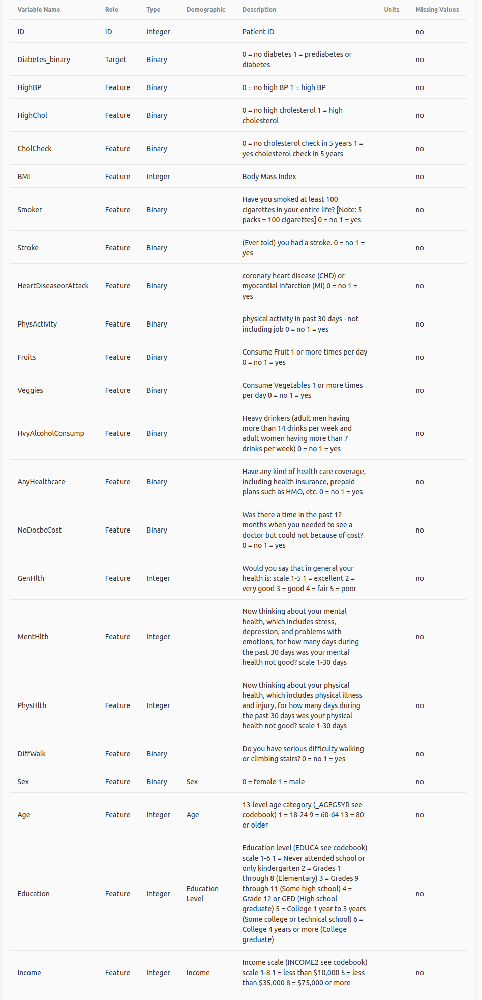

Below is the breakdown of Income level breakdown (INCOME2).

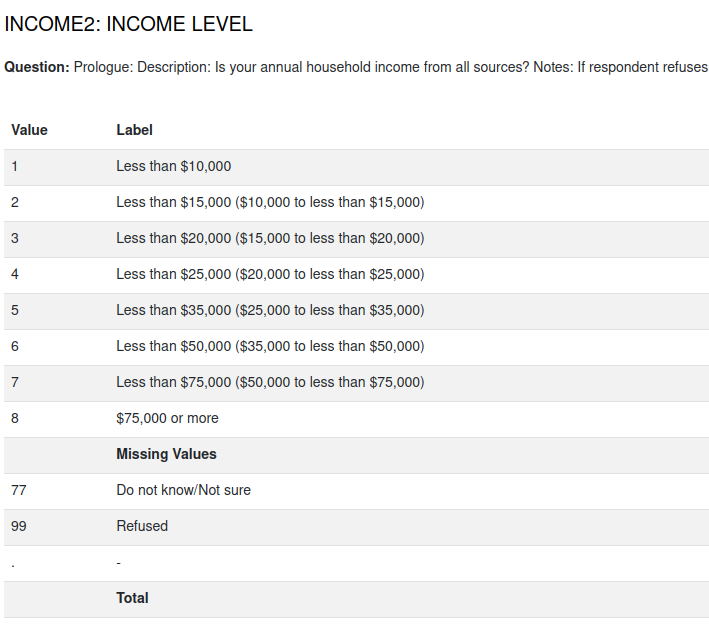

Below is age group break down of AGE5YR (eg; '12' isn't age 12, it is the 12th category).

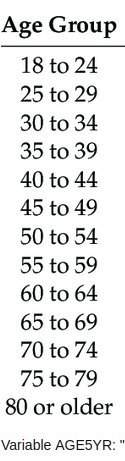

#Importing Data

Below we will import the data

In [7]:
# Import the dataset
cdc_diabetes_health_indicators = fetch_ucirepo(id=891)
# Grab in the data as X - features, and y - targets
# (Diabetes class; 0, no Diabetes, 1 - Diabetic or Prediabetic)
X = cdc_diabetes_health_indicators.data.features
y = cdc_diabetes_health_indicators.data.targets
# Check out the details
print(cdc_diabetes_health_indicators.metadata)
print(cdc_diabetes_health_indicators.variables)

{'uci_id': 891, 'name': 'CDC Diabetes Health Indicators', 'repository_url': 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators', 'data_url': 'https://archive.ics.uci.edu/static/public/891/data.csv', 'abstract': 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy. ', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular', 'Multivariate'], 'num_instances': 253680, 'num_features': 21, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Sex', 'Age', 'Education Level', 'Income'], 'target_col': ['Diabetes_binary'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_

In [8]:
X  # Look at X (features)

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1,1,1,40,1,0,0,0,0,1,...,1,0,5,18,15,1,0,9,4,3
1,0,0,0,25,1,0,0,1,0,0,...,0,1,3,0,0,0,0,7,6,1
2,1,1,1,28,0,0,0,0,1,0,...,1,1,5,30,30,1,0,9,4,8
3,1,0,1,27,0,0,0,1,1,1,...,1,0,2,0,0,0,0,11,3,6
4,1,1,1,24,0,0,0,1,1,1,...,1,0,2,3,0,0,0,11,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1,1,1,45,0,0,0,0,1,1,...,1,0,3,0,5,0,1,5,6,7
253676,1,1,1,18,0,0,0,0,0,0,...,1,0,4,0,0,1,0,11,2,4
253677,0,0,1,28,0,0,0,1,1,0,...,1,0,1,0,0,0,0,2,5,2
253678,1,0,1,23,0,0,0,0,1,1,...,1,0,3,0,0,0,1,7,5,1


In [9]:
y  # Look at y (label)

,Diabetes_binary
0,0
1,0
2,0
3,0
4,0
...,...
253675,0
253676,1
253677,0
253678,0


In [10]:
# Set as DF and check all.
df = pd.DataFrame(X)
df.head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1,1,1,40,1,0,0,0,0,1,...,1,0,5,18,15,1,0,9,4,3
1,0,0,0,25,1,0,0,1,0,0,...,0,1,3,0,0,0,0,7,6,1
2,1,1,1,28,0,0,0,0,1,0,...,1,1,5,30,30,1,0,9,4,8
3,1,0,1,27,0,0,0,1,1,1,...,1,0,2,0,0,0,0,11,3,6
4,1,1,1,24,0,0,0,1,1,1,...,1,0,2,3,0,0,0,11,5,4


The data has 20 features and one label.  All columns are named.

In [11]:
df.columns  # Check all columns listed

Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [12]:
cdc_diabetes_health_indicators  # The indicators

{'data': {'ids':             ID
  0            0
  1            1
  2            2
  3            3
  4            4
  ...        ...
  253675  253675
  253676  253676
  253677  253677
  253678  253678
  253679  253679
  
  [253680 rows x 1 columns],
  'features':         HighBP  HighChol  CholCheck  BMI  Smoker  Stroke  \
  0            1         1          1   40       1       0   
  1            0         0          0   25       1       0   
  2            1         1          1   28       0       0   
  3            1         0          1   27       0       0   
  4            1         1          1   24       0       0   
  ...        ...       ...        ...  ...     ...     ...   
  253675       1         1          1   45       0       0   
  253676       1         1          1   18       0       0   
  253677       0         0          1   28       0       0   
  253678       1         0          1   23       0       0   
  253679       1         1          1   25       0     

Inspect the data further

In [13]:
print("=====================================================================")
print("Check all the data file details:")
print("---------------------------------------------------------------------")
print(df.describe())
print("=====================================================================")

Check all the data file details:
---------------------------------------------------------------------
              HighBP       HighChol      CholCheck            BMI  \
count  253680.000000  253680.000000  253680.000000  253680.000000   
mean        0.429001       0.424121       0.962670      28.382364   
std         0.494934       0.494210       0.189571       6.608694   
min         0.000000       0.000000       0.000000      12.000000   
25%         0.000000       0.000000       1.000000      24.000000   
50%         0.000000       0.000000       1.000000      27.000000   
75%         1.000000       1.000000       1.000000      31.000000   
max         1.000000       1.000000       1.000000      98.000000   

              Smoker         Stroke  HeartDiseaseorAttack   PhysActivity  \
count  253680.000000  253680.000000         253680.000000  253680.000000   
mean        0.443169       0.040571              0.094186       0.756544   
std         0.496761       0.197294            

In [14]:
print("=====================================================================")
print("Check the file shape:")
print("---------------------------------------------------------------------")
print(df.shape)
print("=====================================================================")

Check the file shape:
---------------------------------------------------------------------
(253680, 21)


In [15]:
print("=====================================================================")
print("Check the data file info - columns,")
print("Non Null Counts and Data Types ('Dtypes'):")
print("---------------------------------------------------------------------")
print(df.info())
print("=====================================================================")

Check the data file info - columns,
Non Null Counts and Data Types ('Dtypes'):
---------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   HighBP                253680 non-null  int64
 1   HighChol              253680 non-null  int64
 2   CholCheck             253680 non-null  int64
 3   BMI                   253680 non-null  int64
 4   Smoker                253680 non-null  int64
 5   Stroke                253680 non-null  int64
 6   HeartDiseaseorAttack  253680 non-null  int64
 7   PhysActivity          253680 non-null  int64
 8   Fruits                253680 non-null  int64
 9   Veggies               253680 non-null  int64
 10  HvyAlcoholConsump     253680 non-null  int64
 11  AnyHealthcare         253680 non-null  int64
 12  NoDocbcCost           253680 non-nu

In [16]:
print("======================================================================")
print("The column names in the data are:")
print("----------------------------------------------------------------------")
print(df.columns)
print("======================================================================")

The column names in the data are:
----------------------------------------------------------------------
Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')


In [17]:
print("=====================================================================")
print('The number of dimensions in the data is/are:', df.ndim)
print("=====================================================================")

The number of dimensions in the data is/are: 2


In [18]:
# join x and y into a single dataset to use for analysis
cdc_df = pd.concat([X, y], axis=1).reindex(X.index)
cdc_df  # view it

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
0,1,1,1,40,1,0,0,0,0,1,...,0,5,18,15,1,0,9,4,3,0
1,0,0,0,25,1,0,0,1,0,0,...,1,3,0,0,0,0,7,6,1,0
2,1,1,1,28,0,0,0,0,1,0,...,1,5,30,30,1,0,9,4,8,0
3,1,0,1,27,0,0,0,1,1,1,...,0,2,0,0,0,0,11,3,6,0
4,1,1,1,24,0,0,0,1,1,1,...,0,2,3,0,0,0,11,5,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1,1,1,45,0,0,0,0,1,1,...,0,3,0,5,0,1,5,6,7,0
253676,1,1,1,18,0,0,0,0,0,0,...,0,4,0,0,1,0,11,2,4,1
253677,0,0,1,28,0,0,0,1,1,0,...,0,1,0,0,0,0,2,5,2,0
253678,1,0,1,23,0,0,0,0,1,1,...,0,3,0,0,0,1,7,5,1,0


In [19]:
# Check for missing values
# Check the file; inspect for any errors that would
# require fixing the dataset further.
print("====================================================================")
print("Check file details:")
print(cdc_df.describe())
print("====================================================================")
print("Check file shape:")
print(cdc_df.shape)
print("====================================================================")
print("Check file info:")
print(cdc_df.info())
print("====================================================================")
print("Check for null values where python hasn't identified as NaN,")
print("and display here:")
print(np.where(pd.isnull(cdc_df)))
print("====================================================================")
# No discernable errors in the data.

Check file details:
              HighBP       HighChol      CholCheck            BMI  \
count  253680.000000  253680.000000  253680.000000  253680.000000   
mean        0.429001       0.424121       0.962670      28.382364   
std         0.494934       0.494210       0.189571       6.608694   
min         0.000000       0.000000       0.000000      12.000000   
25%         0.000000       0.000000       1.000000      24.000000   
50%         0.000000       0.000000       1.000000      27.000000   
75%         1.000000       1.000000       1.000000      31.000000   
max         1.000000       1.000000       1.000000      98.000000   

              Smoker         Stroke  HeartDiseaseorAttack   PhysActivity  \
count  253680.000000  253680.000000         253680.000000  253680.000000   
mean        0.443169       0.040571              0.094186       0.756544   
std         0.496761       0.197294              0.292087       0.429169   
min         0.000000       0.000000              0.000

Create and visually inspect the data

Text(0.5, 1.0, 'Diabetes_binary Distribution')

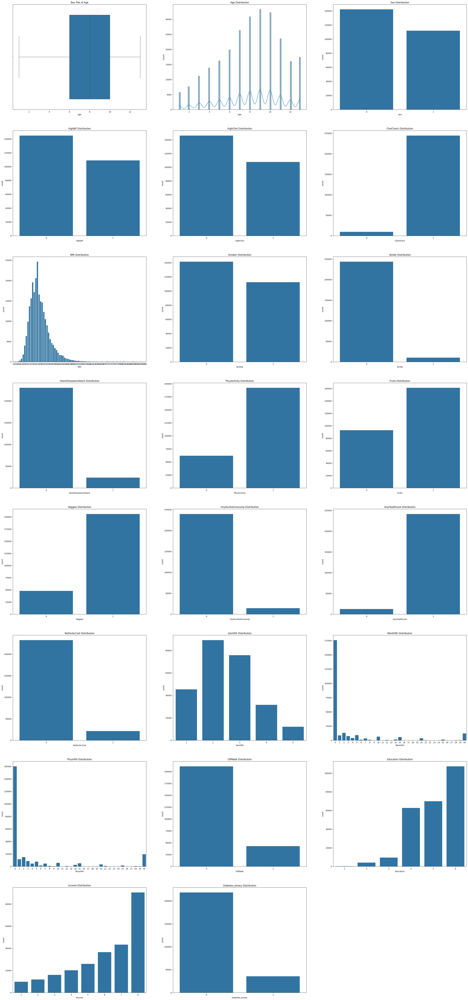

In [20]:
# plot setup
plt.figure(figsize=(42, 92))

# Descriptive Statistics of Age
plt.subplot(8, 3, 1)
sns.boxplot(x=cdc_df['Age'])
plt.title('Box Plot of Age')

# Age Distribution
plt.subplot(8, 3, 2)
sns.histplot(cdc_df['Age'], kde=True)
plt.title('Age Distribution')

# Gender Distribution
plt.subplot(8, 3, 3)
sns.countplot(x=cdc_df['Sex'])
plt.title('Sex Distribution')

#####################################

# HighBP Distribution
plt.subplot(8, 3, 4)
sns.countplot(x=cdc_df['HighBP'])
plt.title('HighBP Distribution')

# HighChol Distribution
plt.subplot(8, 3, 5)
sns.countplot(x=cdc_df['HighChol'])
plt.title('HighChol Distribution')

# CholCheck Distribution
plt.subplot(8, 3, 6)
sns.countplot(x=cdc_df['CholCheck'])
plt.title('CholCheck Distribution')

######################################

# BMI Distribution
plt.subplot(8, 3, 7)
sns.countplot(x=cdc_df['BMI'])
plt.title('BMI Distribution')

# Smoker Distribution
plt.subplot(8, 3, 8)
sns.countplot(x=cdc_df['Smoker'])
plt.title('Smoker Distribution')

# Stroke Distribution
plt.subplot(8, 3, 9)
sns.countplot(x=cdc_df['Stroke'])
plt.title('Stroke Distribution')

######################################

# HeartDiseaseorAttack Distribution
plt.subplot(8, 3, 10)
sns.countplot(x=cdc_df['HeartDiseaseorAttack'])
plt.title('HeartDiseaseorAttack Distribution')

# PhysActivity Distribution
plt.subplot(8, 3, 11)
sns.countplot(x=cdc_df['PhysActivity'])
plt.title('PhysActivity Distribution')

# Fruits Distribution
plt.subplot(8, 3, 12)
sns.countplot(x=cdc_df['Fruits'])
plt.title('Fruits Distribution')

###################################

# Veggies Distribution
plt.subplot(8, 3, 13)
sns.countplot(x=cdc_df['Veggies'])
plt.title('Veggies Distribution')

# HvyAlcoholConsump Distribution
plt.subplot(8, 3, 14)
sns.countplot(x=cdc_df['HvyAlcoholConsump'])
plt.title('HvyAlcoholConsump Distribution')

# AnyHealthcare Distribution
plt.subplot(8, 3, 15)
sns.countplot(x=cdc_df['AnyHealthcare'])
plt.title('AnyHealthcare Distribution')

###################################

# NoDocbcCost Distribution
plt.subplot(8, 3, 16)
sns.countplot(x=cdc_df['NoDocbcCost'])
plt.title('NoDocbcCost Distribution')

# GenHlth Distribution
plt.subplot(8, 3, 17)
sns.countplot(x=cdc_df['GenHlth'])
plt.title('GenHlth Distribution')

# MentHlth Distribution
plt.subplot(8, 3, 18)
sns.countplot(x=cdc_df['MentHlth'])
plt.title('MentHlth Distribution')

###################################

# PhysHlth Distribution
plt.subplot(8, 3, 19)
sns.countplot(x=cdc_df['PhysHlth'])
plt.title('PhysHlth Distribution')

# DiffWalk Distribution
plt.subplot(8, 3, 20)
sns.countplot(x=cdc_df['DiffWalk'])
plt.title('DiffWalk Distribution')

# Education Distribution
plt.subplot(8, 3, 21)
sns.countplot(x=cdc_df['Education'])
plt.title('Education Distribution')

###################################

# Income Distribution
plt.subplot(8, 3, 22)
sns.countplot(x=cdc_df['Income'])
plt.title('Income Distribution')

# Diabetes_binary Distribution
plt.subplot(8, 3, 23)
sns.countplot(x=cdc_df['Diabetes_binary'])
plt.title('Diabetes_binary Distribution')


#Investigate features and data more.



Diabetes Binary - 0 = no diabetes 1 = prediabetes or diabetes


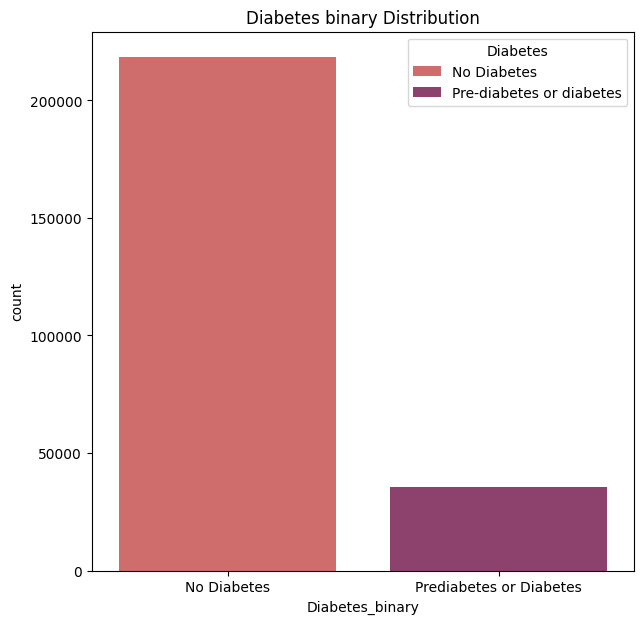

In [21]:
# plot setup
# @title Diabetes binary distribution
plt.figure(figsize=(7, 7))
print("Diabetes Binary - 0 = no diabetes 1 = prediabetes or diabetes")
# Diabetes_binary Distribution
feature_label = {0: 'No Diabetes', 1: 'Prediabetes or Diabetes'}
graph = sns.countplot(x=cdc_df['Diabetes_binary'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.title('Diabetes binary Distribution')
plt.legend(title='Diabetes', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.show(graph)

	0 = no high BP 1 = high BP


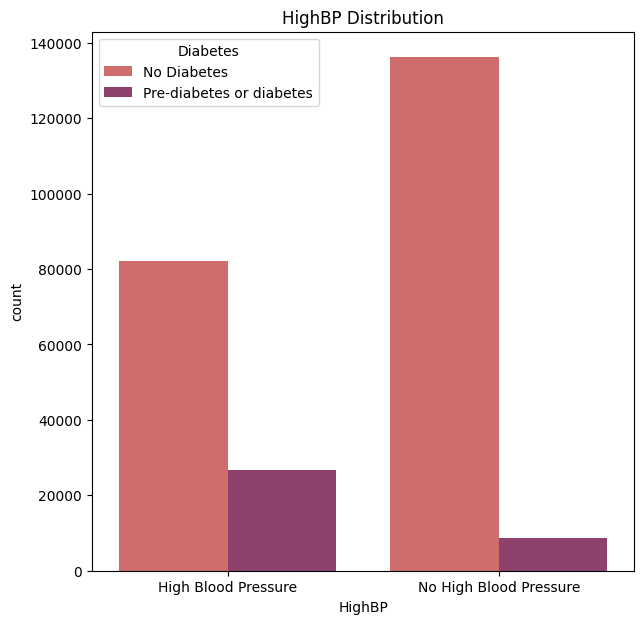

In [22]:
# plot setup
# @title High Blood Pressure distribution
plt.figure(figsize=(7, 7))
print("	0 = no high BP 1 = high BP")
# Diabetes_binary Distribution
feature_label = {0: 'No High Blood Pressure', 1: 'High Blood Pressure'}
graph = sns.countplot(x=cdc_df['HighBP'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.title('HighBP Distribution')
plt.legend(title='Diabetes', loc='upper left',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.show(graph)

	0 = no high cholesterol 1 = high cholesterol


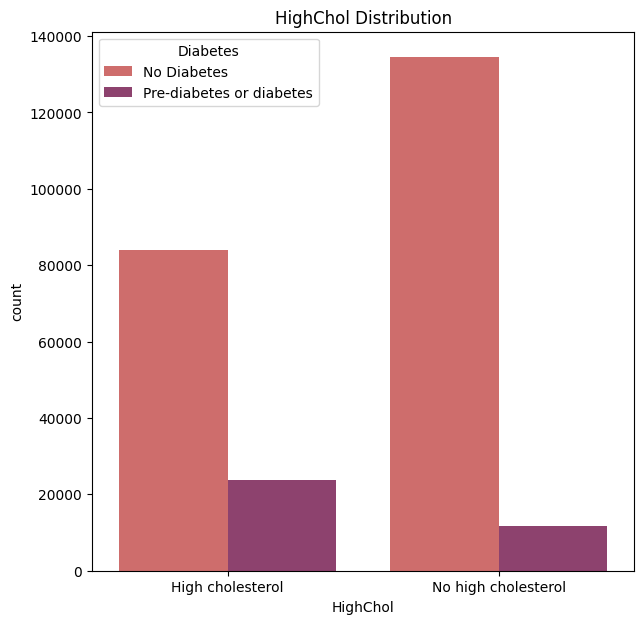

In [23]:
# plot setup
# @title High cholesterol vs diabetes distribution
plt.figure(figsize=(7, 7))
print("	0 = no high cholesterol 1 = high cholesterol")
# HighChol Distribution
feature_label = {0: 'No high cholesterol', 1: 'High cholesterol'}
graph = sns.countplot(x=cdc_df['HighChol'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.title('HighChol Distribution')
plt.legend(title='Diabetes', loc='upper left',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.show(graph)

	0 = no cholesterol check in 5 years
1 = yes cholesterol check in 5 years


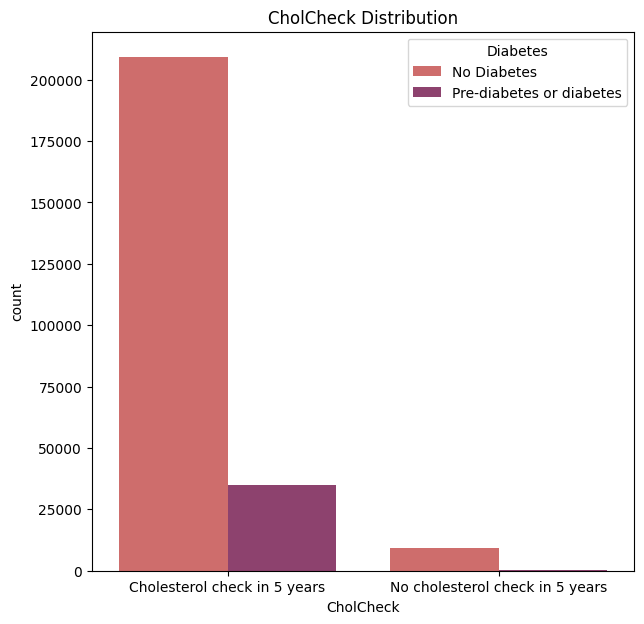

In [24]:
# plot setup
# @title Cholesterol Check vs diabetes distribution
plt.figure(figsize=(7, 7))
print("	0 = no cholesterol check in 5 years")
print("1 = yes cholesterol check in 5 years")
# CholCheck Distribution
feature_label = {0: 'No cholesterol check in 5 years',
                 1: 'Cholesterol check in 5 years'}
graph = sns.countplot(x=cdc_df['CholCheck'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.title('CholCheck Distribution')
plt.legend(title='Diabetes', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.show(graph)

BMI Index


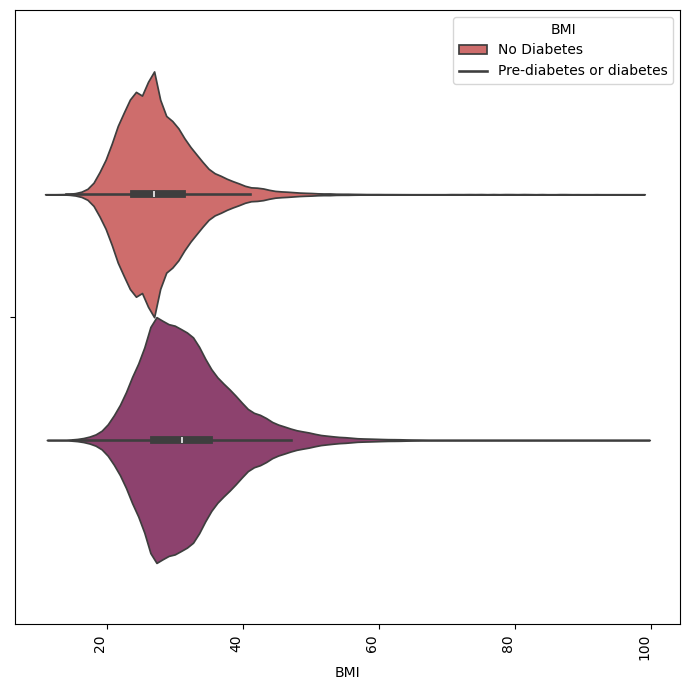

In [25]:
# plot setup
# @title BMI vs diabetes distribution
plt.figure(figsize=(7, 7))
print("BMI Index")
# BMI Distribution
graph = sns.violinplot(x=cdc_df['BMI'], palette='flare',
                       hue=cdc_df['Diabetes_binary'], legend=False)
plt.legend(title='BMI', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show(graph)

Have you smoked at least 100 cigarettes in your entire life?
[Note: 5 packs = 100 cigarettes] 0 = no 1 = yes


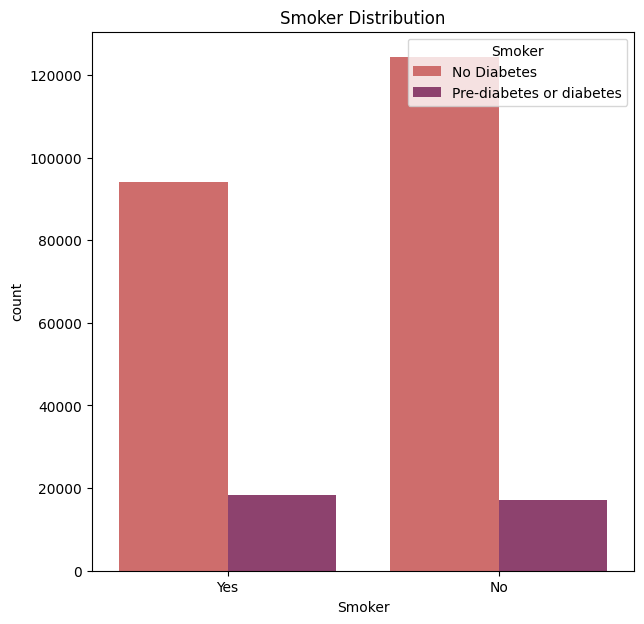

In [26]:
# plot setup
plt.figure(figsize=(7, 7))
print("Have you smoked at least 100 cigarettes in your entire life?")
print("[Note: 5 packs = 100 cigarettes] 0 = no 1 = yes")
# Smoker Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['Smoker'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='Smoker', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('Smoker Distribution')
plt.show(graph)

(Ever told) you had a stroke. 0 = no 1 = yes


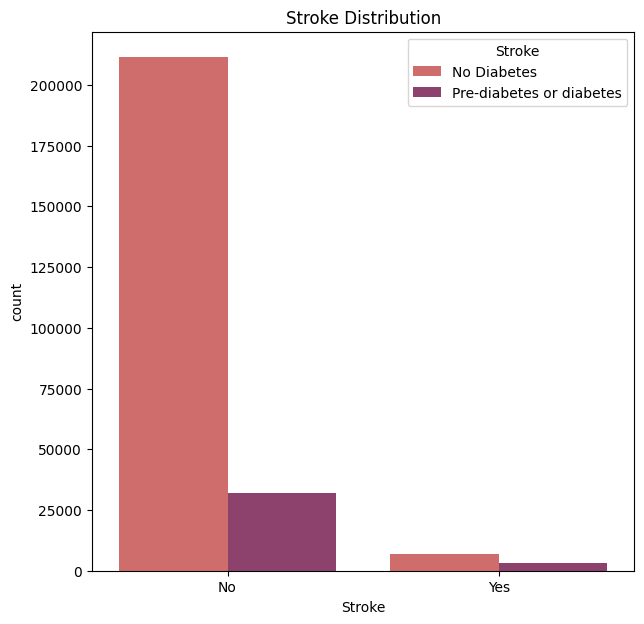

In [27]:
# plot setup
# @title Stroke vs diabetes distribution
plt.figure(figsize=(7, 7))
print("(Ever told) you had a stroke. 0 = no 1 = yes")
# BMI Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['Stroke'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='Stroke', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('Stroke Distribution')
plt.show(graph)

coronary heart disease (CHD) or myocardial infarction (MI)
0 = no 1 = yes


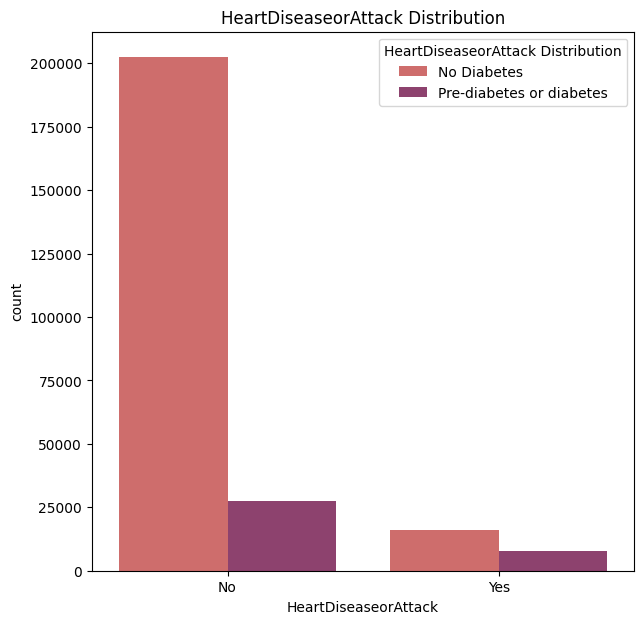

In [28]:
# plot setup
# @title CHD vs diabetes distribution
plt.figure(figsize=(7, 7))
print("coronary heart disease (CHD) or myocardial infarction (MI)")
print("0 = no 1 = yes")
# HeartDiseaseorAttack Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['HeartDiseaseorAttack'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='HeartDiseaseorAttack Distribution',
           loc='upper right', labels=['No Diabetes',
                                      'Pre-diabetes or diabetes'])
plt.title('HeartDiseaseorAttack Distribution')
plt.show(graph)


physical activity in past 30 days - not including job 0 = no 1 = yes


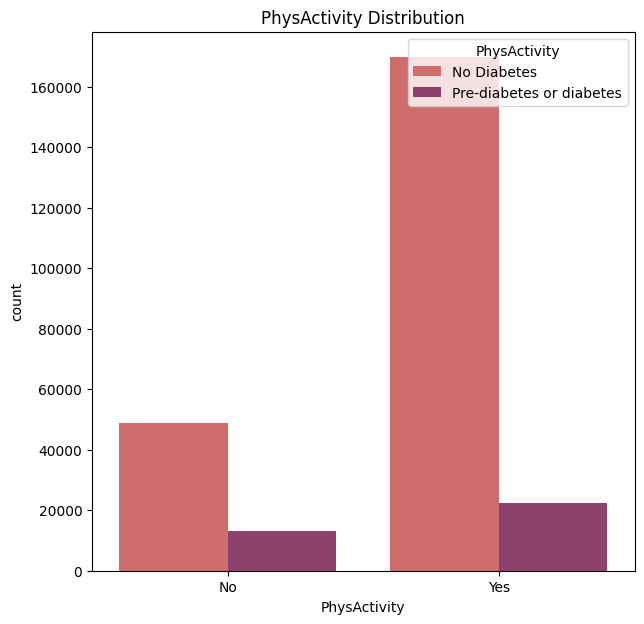

In [29]:
# plot setup
# @title Physical Activity vs diabetes distribution
plt.figure(figsize=(7, 7))
print("physical activity in past 30 days - not including job 0 = no 1 = yes")
# PhysActivity Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['PhysActivity'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='PhysActivity', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('PhysActivity Distribution')
plt.show(graph)

Consume Fruit 1 or more times per day 0 = no 1 = yes


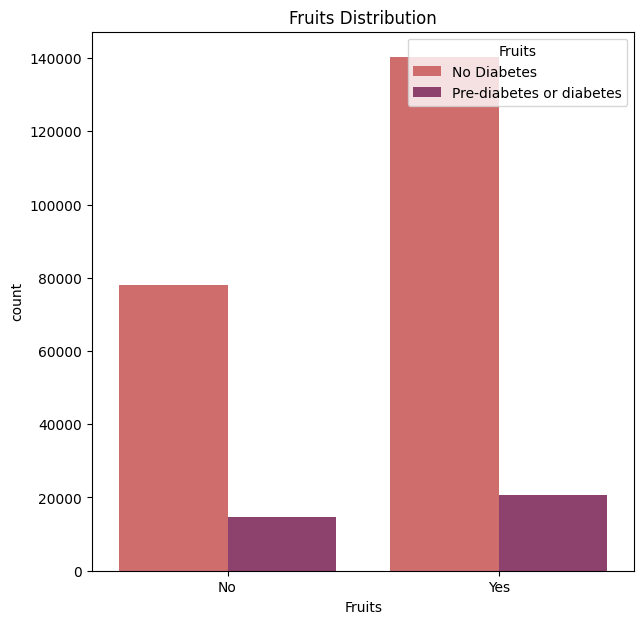

In [30]:
# plot setup
# @title Fruit Consumption vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Consume Fruit 1 or more times per day 0 = no 1 = yes")
# Fruits Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['Fruits'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='Fruits', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('Fruits Distribution')
plt.show(graph)

Consume Vegetables 1 or more times per day 0 = no 1 = yes


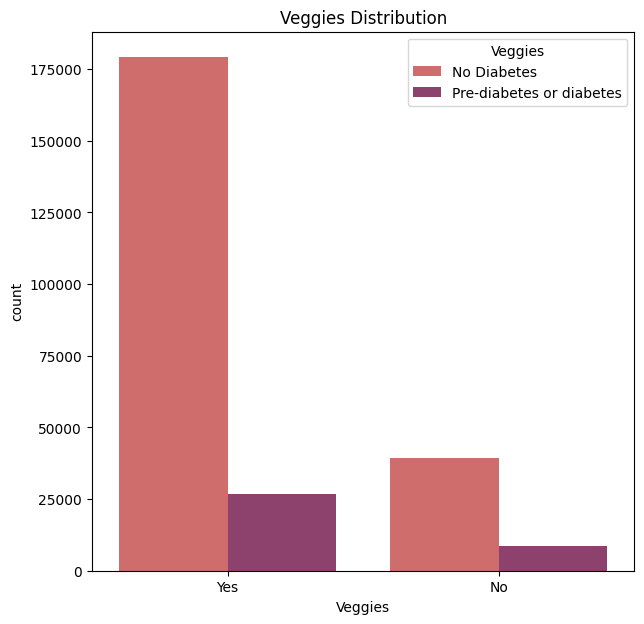

In [31]:
# plot setup
# @title Vegetable consumption vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Consume Vegetables 1 or more times per day 0 = no 1 = yes")
# Veggies Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['Veggies'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='Veggies', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('Veggies Distribution')
plt.show(graph)

Heavy drinkers (adult men having more than 14 drinks per week and
adult women having more than 7 drinks per week) 0 = no 1 = yes


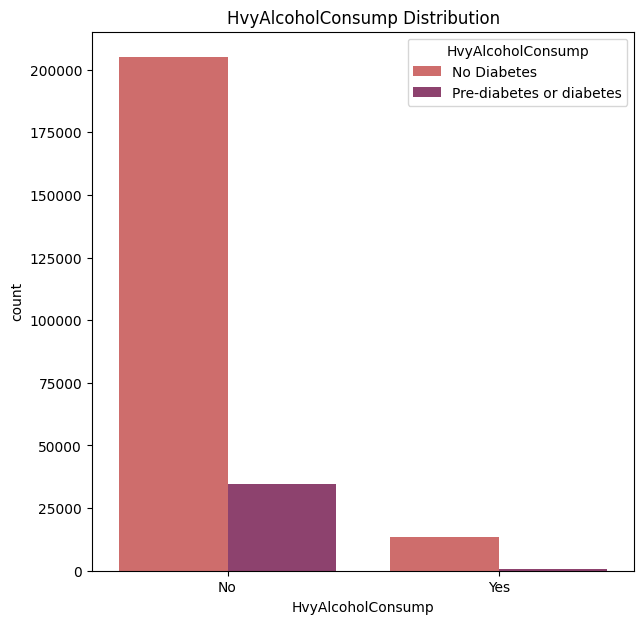

In [32]:
# plot setup
# @title Heavy Alchohol consumption vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Heavy drinkers (adult men having more than 14 drinks per week and")
print("adult women having more than 7 drinks per week) 0 = no 1 = yes")
# HvyAlcoholConsump Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['HvyAlcoholConsump'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='HvyAlcoholConsump', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('HvyAlcoholConsump Distribution')
plt.show(graph)

Have any kind of health care coverage, including health insurance,
prepaid plans such as HMO, etc. 0 = no 1 = yes


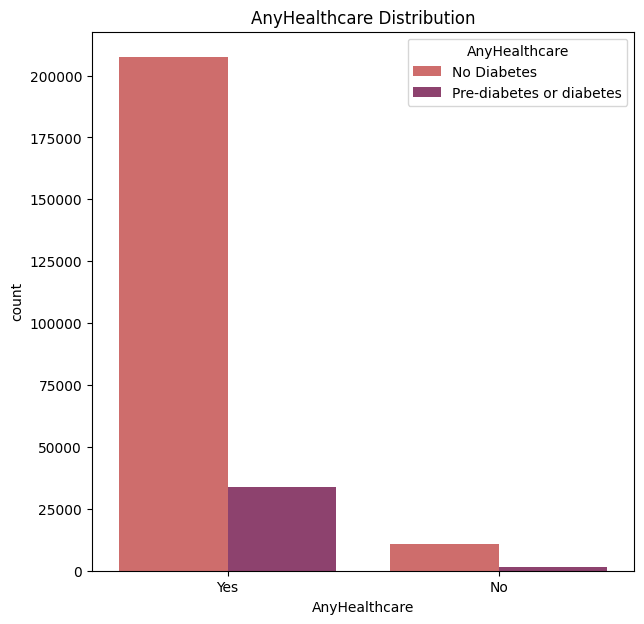

In [33]:
# plot setup
# @title Health care coverage vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Have any kind of health care coverage, including health insurance,")
print("prepaid plans such as HMO, etc. 0 = no 1 = yes")
# AnyHealthcare Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['AnyHealthcare'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='AnyHealthcare', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('AnyHealthcare Distribution')
plt.show(graph)

	Was there a time in the past 12 months when you needed to see a doctor but could not because of cost? 0 = no 1 = yes


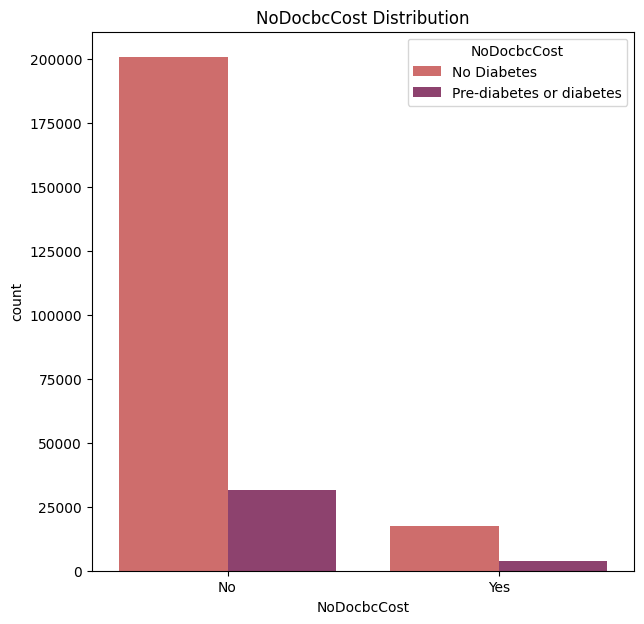

In [34]:
# plot setup
# @title No Medical access due to cost vs diabetes distribution
plt.figure(figsize=(7, 7))
print("	Was there a time in the past 12 months when you needed to see a")
print(" doctor but could not because of cost? 0 = no 1 = yes")
# NoDocbcCost Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['NoDocbcCost'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='NoDocbcCost', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('NoDocbcCost Distribution')
plt.show(graph)

	Would you say that in general your health is: scale 1-5 1 = excellent
 2 = very good 3 = good 4 = fair 5 = poor


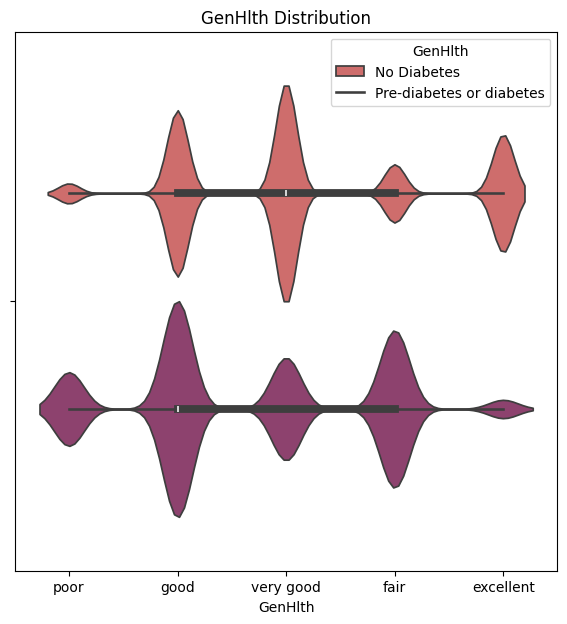

In [35]:
# plot setup
# @title General Health vs diabetes distribution
plt.figure(figsize=(7, 7))
print("	Would you say that in general your health is: scale 1-5 1 = excellent")
print(" 2 = very good 3 = good 4 = fair 5 = poor")
# GenHlth Distribution
feature_label = {1: 'excellent', 2: 'very good', 3: 'good',
                 4: 'fair', 5: 'poor'}
graph = sns.violinplot(x=cdc_df['GenHlth'].map(feature_label),
                       palette='flare', hue=cdc_df['Diabetes_binary'],
                       legend=False)
plt.legend(title='GenHlth', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('GenHlth Distribution')
plt.show(graph)

Now thinking about your mental health, which includes stress, 
depression, and problems with emotions, for how many days during 
the past 30 days was your mental health not good? scale 1-30 days


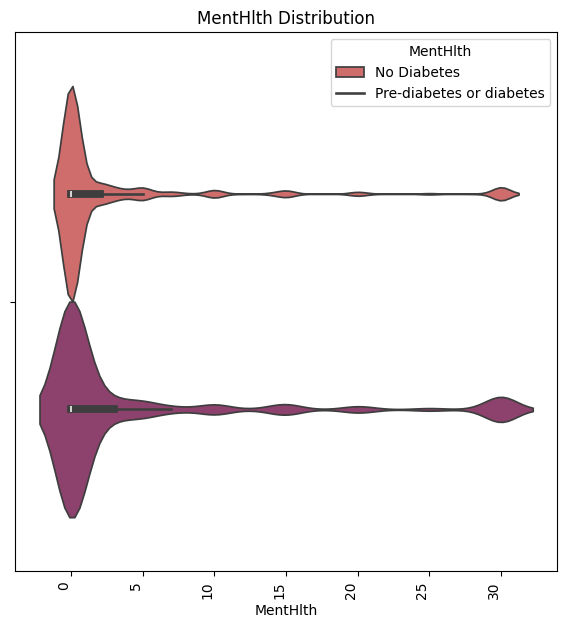

In [36]:
# plot setup
# @title Mental Health vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Now thinking about your mental health, which includes stress, ")
print("depression, and problems with emotions, for how many days during ")
print("the past 30 days was your mental health not good? scale 1-30 days")
# MentHlth Distribution
graph = sns.violinplot(x=cdc_df['MentHlth'], palette='flare',
                       hue=cdc_df['Diabetes_binary'], legend=False)
plt.legend(title='MentHlth', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.xticks(rotation=90, ha='right')
plt.title('MentHlth Distribution')
plt.show(graph)

Now thinking about your physical health, which includes physical 
illness and injury, for how many days during the past 30 days was
your physical health not good? scale 1-30 days


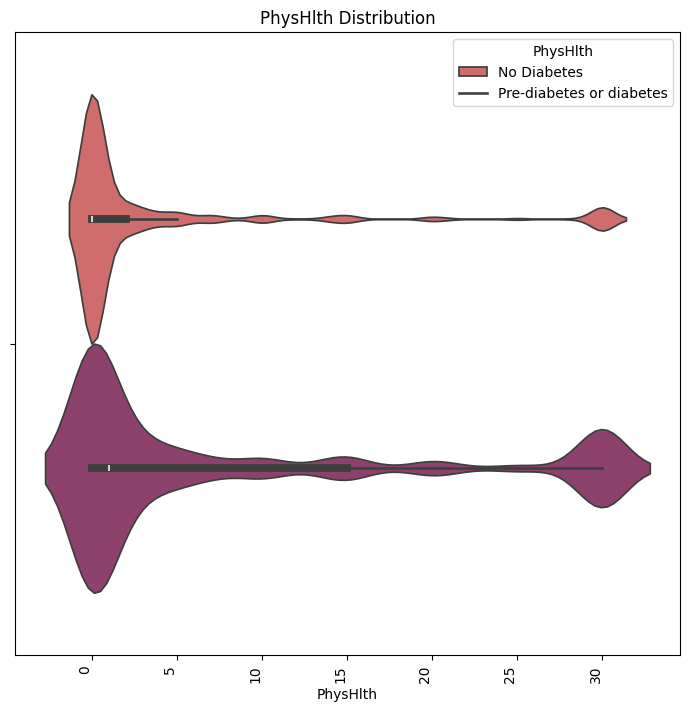

In [37]:
# lot setup
# @title Physical Health vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Now thinking about your physical health, which includes physical ")
print("illness and injury, for how many days during the past 30 days was")
print("your physical health not good? scale 1-30 days")
# PhysHlth Distribution
graph = sns.violinplot(x=cdc_df['PhysHlth'], palette='flare',
                       hue=cdc_df['Diabetes_binary'], legend=False)
plt.legend(title='PhysHlth', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.title('PhysHlth Distribution')
plt.show(graph)

Do you have serious difficulty walking or climbing stairs?
0 = no 1 = yes


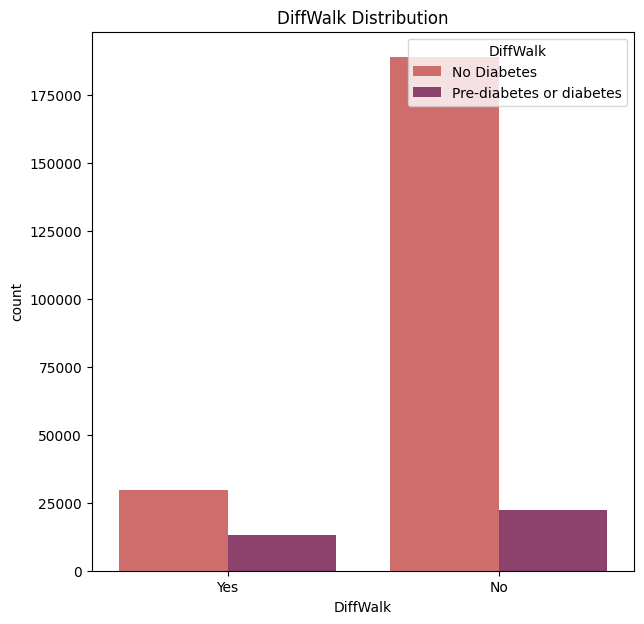

In [38]:
# plot setup
# @title Difficulty Walking vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Do you have serious difficulty walking or climbing stairs?")
print("0 = no 1 = yes")
# DiffWalk Distribution
feature_label = {0: 'No', 1: 'Yes'}
graph = sns.countplot(x=cdc_df['DiffWalk'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='DiffWalk', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('DiffWalk Distribution')
plt.show(graph)

0 = female 1 = male


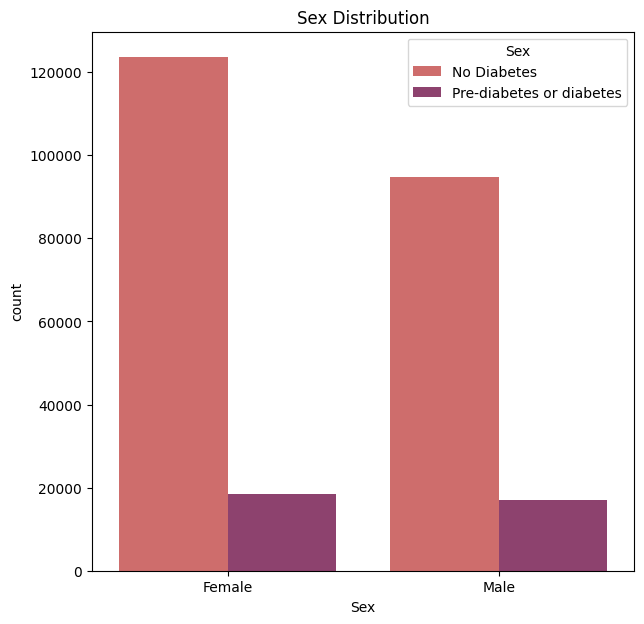

In [39]:
# plot setup
# @title Gender vs diabetes distribution
plt.figure(figsize=(7, 7))
print("0 = female 1 = male")
# Gender Distribution
feature_label = {0: 'Female', 1: 'Male'}
graph = sns.countplot(x=cdc_df['Sex'].map(feature_label),
                      palette='flare', hue=cdc_df['Diabetes_binary'],
                      legend=False)
plt.legend(title='Sex', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.title('Sex Distribution')
plt.show(graph)

13-level age category (_AGEG5YR see codebook)


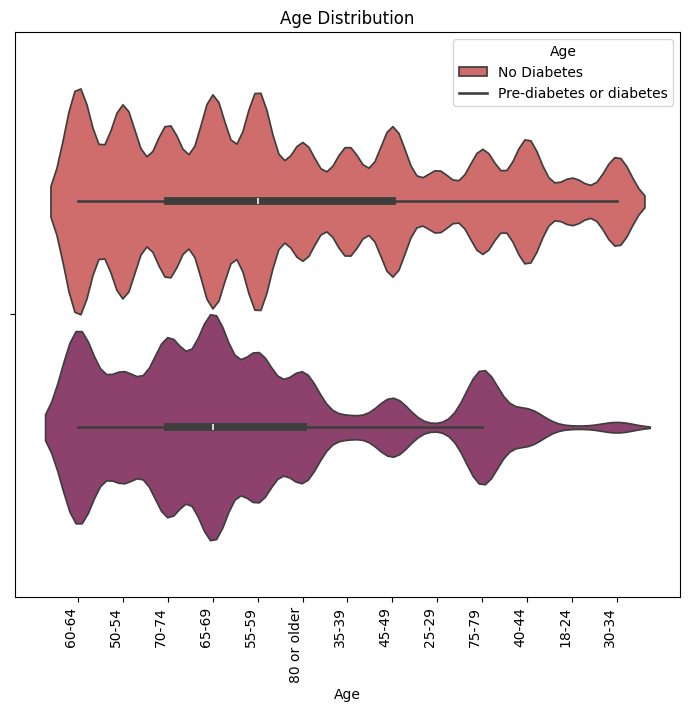

In [40]:
# plot setup
# @title Age vs diabetes distribution
plt.figure(figsize=(7, 7))
print("13-level age category (_AGEG5YR see codebook)")
#  Age Distribution
feature_label = {1: '18-24', 2: '25-29', 3: '30-34', 4: '35-39',
                 5: '40-44', 6: '45-49', 7: '50-54', 8: '55-59',
                 9: '60-64', 10: '65-69', 11: '70-74',
                 12: '75-79', 13: '80 or older'}
graph = sns.violinplot(x=cdc_df['Age'].map(feature_label),
                       palette='flare', hue=cdc_df['Diabetes_binary'],
                       legend=False)
plt.legend(title='Age', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.title('Age Distribution')
plt.show(graph)

Education level (EDUCA see codebook) scale 1-6 1 = Never attended 
school or only kindergarten 2 = Grades 1 through 8 (Elementary) 
3 = Grades 9 through 11 (Some high school) 4 = Grade 12 or 
GED (High school graduate) 5 = College 1 year to 3 years 
(Some college or technical school) 6 = College 4 years or 
 more (College graduate)


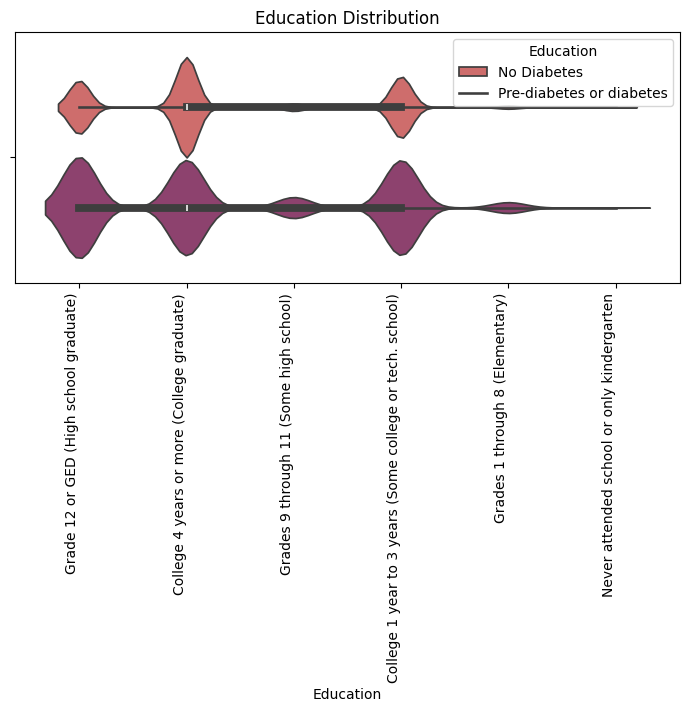

In [41]:
# plot setup
# @title Education vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Education level (EDUCA see codebook) scale 1-6 1 = Never attended ")
print("school or only kindergarten 2 = Grades 1 through 8 (Elementary) ")
print("3 = Grades 9 through 11 (Some high school) 4 = Grade 12 or ")
print("GED (High school graduate) 5 = College 1 year to 3 years ")
print("(Some college or technical school) 6 = College 4 years or ")
print(" more (College graduate)")
# Education Distribution
feature_label = {1: 'Never attended school or only kindergarten',
                 2: 'Grades 1 through 8 (Elementary)',
                 3: 'Grades 9 through 11 (Some high school)',
                 4: 'Grade 12 or GED (High school graduate)',
                 5: 'College 1 year to 3 years (Some college or tech. school)',
                 6: 'College 4 years or more (College graduate)'}
graph = sns.violinplot(x=cdc_df['Education'].map(feature_label),
                       palette='flare', hue=cdc_df['Diabetes_binary'],
                       legend=False)
plt.legend(title='Education', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.title('Education Distribution')
plt.show(graph)

Income scale (INCOME2 see codebook) scale 1-8 1 = less than 
$10,000 5 = less than $35,000 8 = $75,000 or more


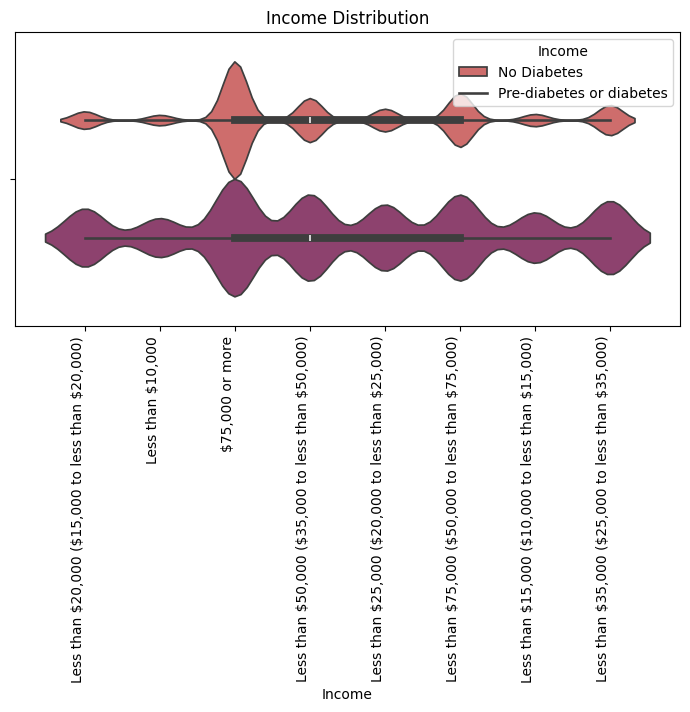

In [42]:
# plot setup
# @title Income vs diabetes distribution
plt.figure(figsize=(7, 7))
print("Income scale (INCOME2 see codebook) scale 1-8 1 = less than ")
print("$10,000 5 = less than $35,000 8 = $75,000 or more")
# Income Distribution
feature_label = {1: 'Less than $10,000',
                 2: 'Less than $15,000 ($10,000 to less than $15,000)',
                 3: 'Less than $20,000 ($15,000 to less than $20,000)',
                 4: 'Less than $25,000 ($20,000 to less than $25,000)',
                 5: 'Less than $35,000 ($25,000 to less than $35,000)',
                 6: 'Less than $50,000 ($35,000 to less than $50,000)',
                 7: 'Less than $75,000 ($50,000 to less than $75,000)',
                 8: '$75,000 or more',
                 77: '	Do not know/Not sure',
                 99: '	Refused'}
graph = sns.violinplot(x=cdc_df['Income'].map(feature_label),
                       palette='flare', hue=cdc_df['Diabetes_binary'],
                       legend=False)
plt.legend(title='Income', loc='upper right',
           labels=['No Diabetes', 'Pre-diabetes or diabetes'])
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.title('Income Distribution')
plt.show(graph)

Correlation Analysis

In [43]:
# @title Columns in data
cdc_df.columns

Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income',
       'Diabetes_binary'],
      dtype='object')

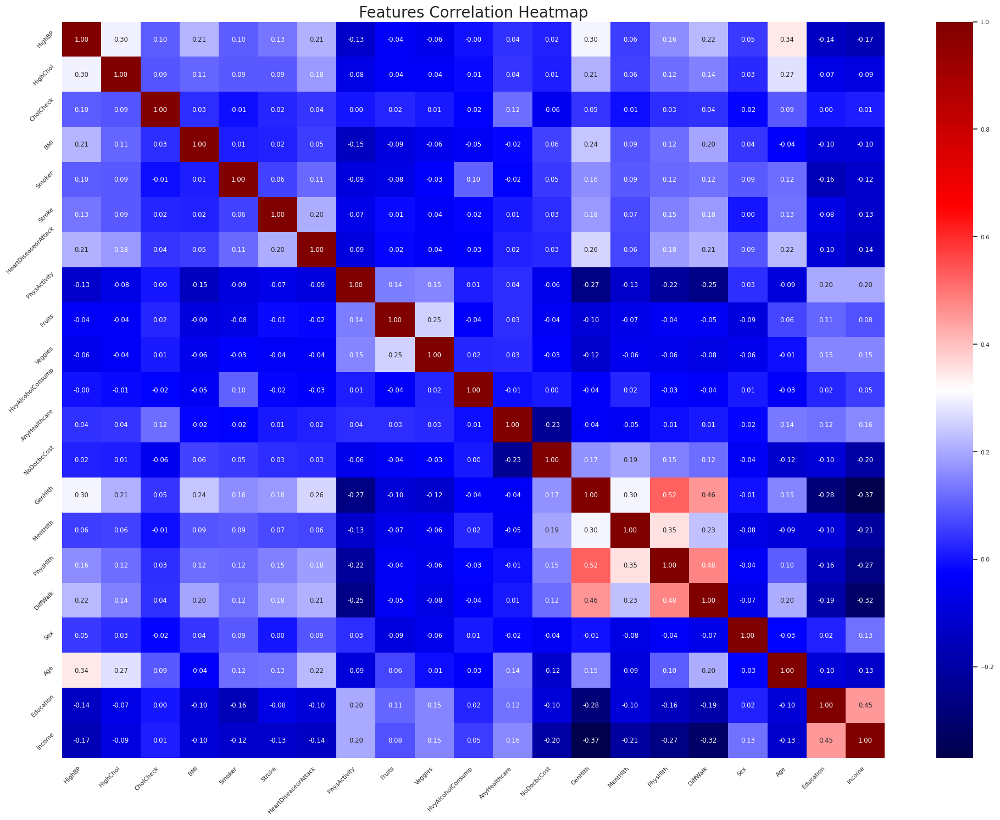

In [46]:
# @title Features correlation headmap
features = ['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
            'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
            'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
            'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
            'Income']

cdc_df_2 = cdc_df.copy()  # copy
correlation = cdc_df[features].corr()
plt.figure(figsize=(20, 15))
sns.set(font_scale=0.7)
sns.heatmap(correlation, annot=True, cmap='seismic', fmt=".2f")
plt.title('Features Correlation Heatmap', fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

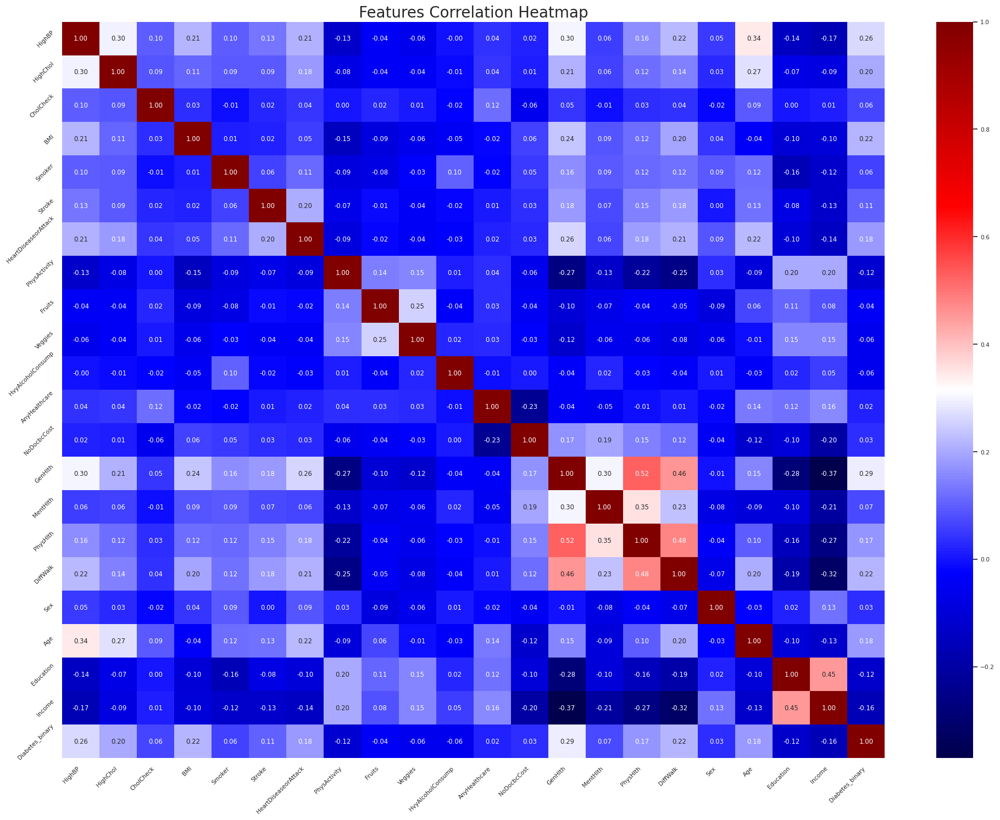

In [47]:
# @title Features correlation headmap
# check for correlation of data fields with diabetes
cdc_df_2 = cdc_df.copy()  # copy
correlation = cdc_df.corr()
plt.figure(figsize=(20, 15))
sns.set(font_scale=0.7)
sns.heatmap(correlation, annot=True, cmap='seismic', fmt=".2f")
plt.title('Features Correlation Heatmap', fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

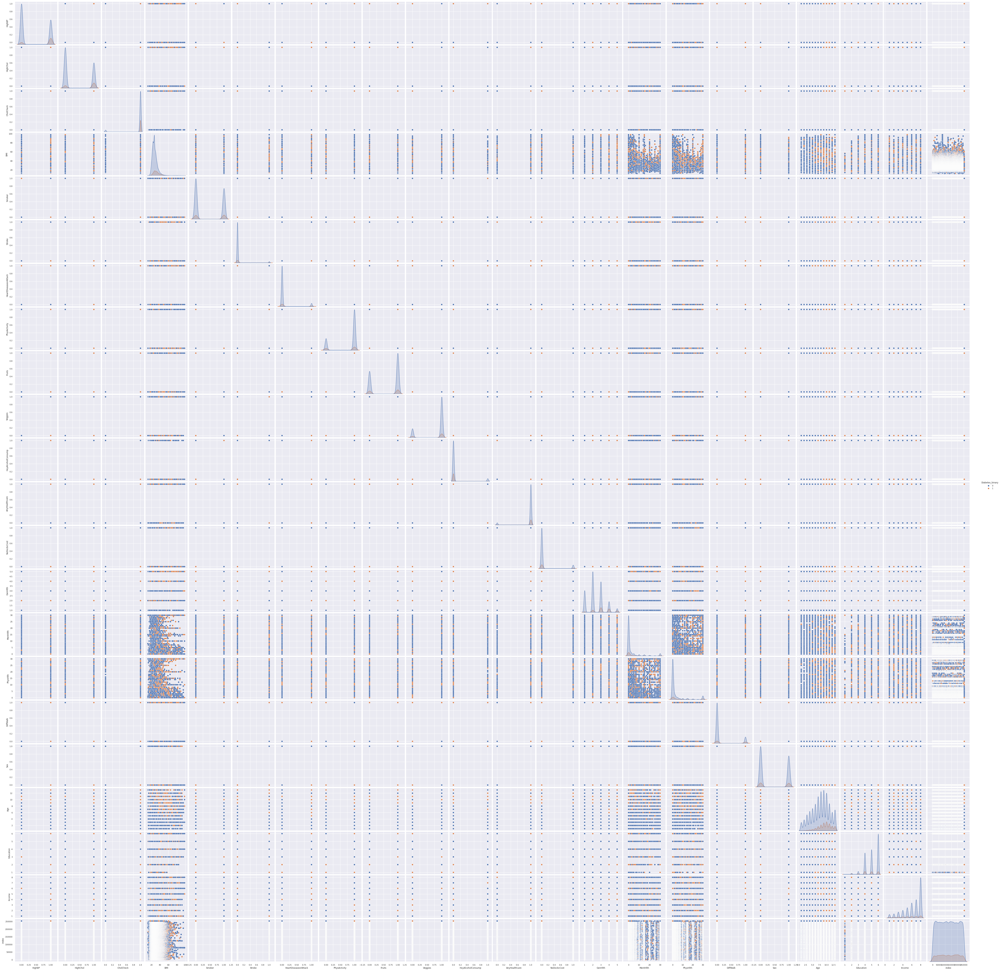

In [ ]:
#  @title Pairplot - based on diabetes
sns.pairplot(cdc_df_2, hue='Diabetes_binary');

In [ ]:
# features = X, class = y

In [48]:
cdc_df_2  # view data

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
0,1,1,1,40,1,0,0,0,0,1,...,0,5,18,15,1,0,9,4,3,0
1,0,0,0,25,1,0,0,1,0,0,...,1,3,0,0,0,0,7,6,1,0
2,1,1,1,28,0,0,0,0,1,0,...,1,5,30,30,1,0,9,4,8,0
3,1,0,1,27,0,0,0,1,1,1,...,0,2,0,0,0,0,11,3,6,0
4,1,1,1,24,0,0,0,1,1,1,...,0,2,3,0,0,0,11,5,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1,1,1,45,0,0,0,0,1,1,...,0,3,0,5,0,1,5,6,7,0
253676,1,1,1,18,0,0,0,0,0,0,...,0,4,0,0,1,0,11,2,4,1
253677,0,0,1,28,0,0,0,1,1,0,...,0,1,0,0,0,0,2,5,2,0
253678,1,0,1,23,0,0,0,0,1,1,...,0,3,0,0,0,1,7,5,1,0


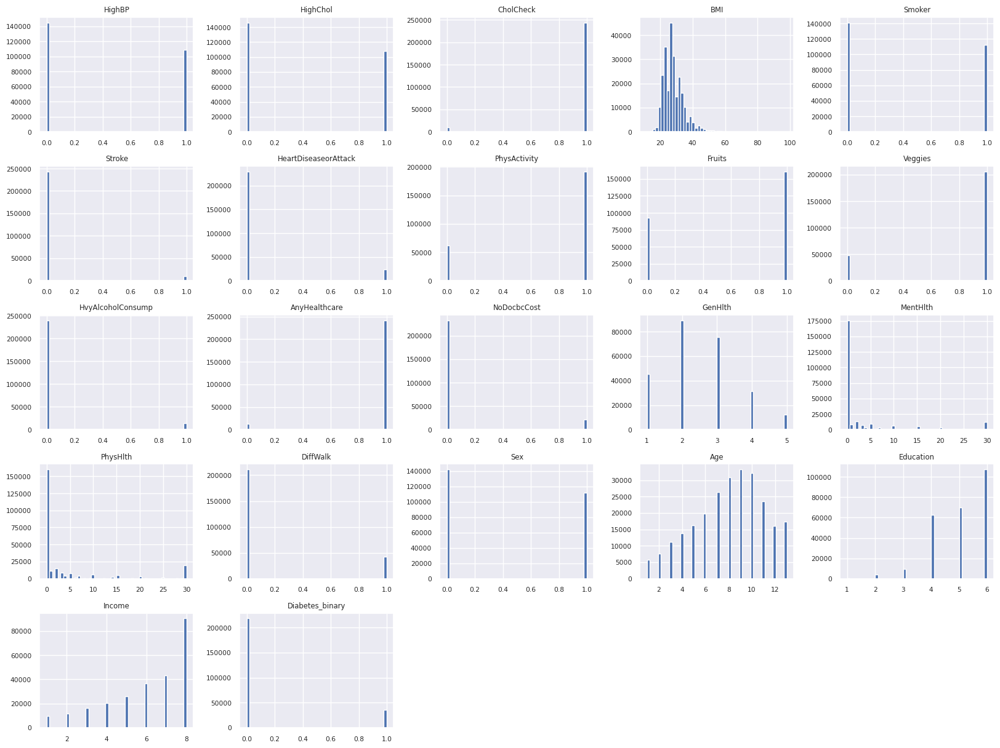

In [49]:
# @title Features inspection
%matplotlib inline
cdc_df_2.hist(bins=50, figsize=(20, 15))
plt.show()

In [50]:
cdc_df_2.describe()  # inspect

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,...,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,0.811420,...,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875,0.139333
std,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,0.391175,...,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148,0.346294
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
25%,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,...,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000,0.000000
50%,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000,0.000000
75%,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000,0.000000
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000,1.000000


In [53]:
# Create correlations
corr_matrix = cdc_df_2.corr()

In [54]:
corr_matrix  # inspect correlation matrix

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
HighBP,1.000000,0.298199,0.098508,0.213748,0.096991,0.129575,0.209361,-0.125267,-0.040555,-0.061266,...,0.017358,0.300530,0.056456,0.161212,0.223618,0.052207,0.344452,-0.141358,-0.171235,0.263129
HighChol,0.298199,1.000000,0.085642,0.106722,0.091299,0.092620,0.180765,-0.078046,-0.040859,-0.039874,...,0.013310,0.208426,0.062069,0.121751,0.144672,0.031205,0.272318,-0.070802,-0.085459,0.200276
CholCheck,0.098508,0.085642,1.000000,0.034495,-0.009929,0.024158,0.044206,0.004190,0.023849,0.006121,...,-0.058255,0.046589,-0.008366,0.031775,0.040585,-0.022115,0.090321,0.001510,0.014259,0.064761
BMI,0.213748,0.106722,0.034495,1.000000,0.013804,0.020153,0.052904,-0.147294,-0.087518,-0.062275,...,0.058206,0.239185,0.085310,0.121141,0.197078,0.042950,-0.036618,-0.103932,-0.100069,0.216843
Smoker,0.096991,0.091299,-0.009929,0.013804,1.000000,0.061173,0.114441,-0.087401,-0.077666,-0.030678,...,0.048946,0.163143,0.092196,0.116460,0.122463,0.093662,0.120641,-0.161955,-0.123937,0.060789
Stroke,0.129575,0.092620,0.024158,0.020153,0.061173,1.000000,0.203002,-0.069151,-0.013389,-0.041124,...,0.034804,0.177942,0.070172,0.148944,0.176567,0.002978,0.126974,-0.076009,-0.128599,0.105816
HeartDiseaseorAttack,0.209361,0.180765,0.044206,0.052904,0.114441,0.203002,1.000000,-0.087299,-0.019790,-0.039167,...,0.031000,0.258383,0.064621,0.181698,0.212709,0.086096,0.221618,-0.099600,-0.141011,0.177282
PhysActivity,-0.125267,-0.078046,0.004190,-0.147294,-0.087401,-0.069151,-0.087299,1.000000,0.142756,0.153150,...,-0.061638,-0.266186,-0.125587,-0.219230,-0.253174,0.032482,-0.092511,0.199658,0.198539,-0.118133
Fruits,-0.040555,-0.040859,0.023849,-0.087518,-0.077666,-0.013389,-0.019790,0.142756,1.000000,0.254342,...,-0.044243,-0.103854,-0.068217,-0.044633,-0.048352,-0.091175,0.064547,0.110187,0.079929,-0.040779
Veggies,-0.061266,-0.039874,0.006121,-0.062275,-0.030678,-0.041124,-0.039167,0.153150,0.254342,1.000000,...,-0.032232,-0.123066,-0.058884,-0.064290,-0.080506,-0.064765,-0.009771,0.154329,0.151087,-0.056584


In [55]:
correl_abs = abs(corr_matrix.Diabetes_binary)
correl_abs.columns = ['feature', 'correlation']

In [56]:
corr_matrix.Diabetes_binary

HighBP                  0.263129
HighChol                0.200276
CholCheck               0.064761
BMI                     0.216843
Smoker                  0.060789
Stroke                  0.105816
HeartDiseaseorAttack    0.177282
PhysActivity           -0.118133
Fruits                 -0.040779
Veggies                -0.056584
HvyAlcoholConsump      -0.057056
AnyHealthcare           0.016255
NoDocbcCost             0.031433
GenHlth                 0.293569
MentHlth                0.069315
PhysHlth                0.171337
DiffWalk                0.218344
Sex                     0.031430
Age                     0.177442
Education              -0.124456
Income                 -0.163919
Diabetes_binary         1.000000
Name: Diabetes_binary, dtype: float64

In [57]:
correl_abs.sort_values(ascending=False)

Diabetes_binary         1.000000
GenHlth                 0.293569
HighBP                  0.263129
DiffWalk                0.218344
BMI                     0.216843
HighChol                0.200276
Age                     0.177442
HeartDiseaseorAttack    0.177282
PhysHlth                0.171337
Income                  0.163919
Education               0.124456
PhysActivity            0.118133
Stroke                  0.105816
MentHlth                0.069315
CholCheck               0.064761
Smoker                  0.060789
HvyAlcoholConsump       0.057056
Veggies                 0.056584
Fruits                  0.040779
NoDocbcCost             0.031433
Sex                     0.031430
AnyHealthcare           0.016255
Name: Diabetes_binary, dtype: float64

array([[<Axes: xlabel='Diabetes_binary', ylabel='Diabetes_binary'>,
        <Axes: xlabel='GenHlth', ylabel='Diabetes_binary'>,
        <Axes: xlabel='HighBP', ylabel='Diabetes_binary'>],
       [<Axes: xlabel='Diabetes_binary', ylabel='GenHlth'>,
        <Axes: xlabel='GenHlth', ylabel='GenHlth'>,
        <Axes: xlabel='HighBP', ylabel='GenHlth'>],
       [<Axes: xlabel='Diabetes_binary', ylabel='HighBP'>,
        <Axes: xlabel='GenHlth', ylabel='HighBP'>,
        <Axes: xlabel='HighBP', ylabel='HighBP'>]], dtype=object)

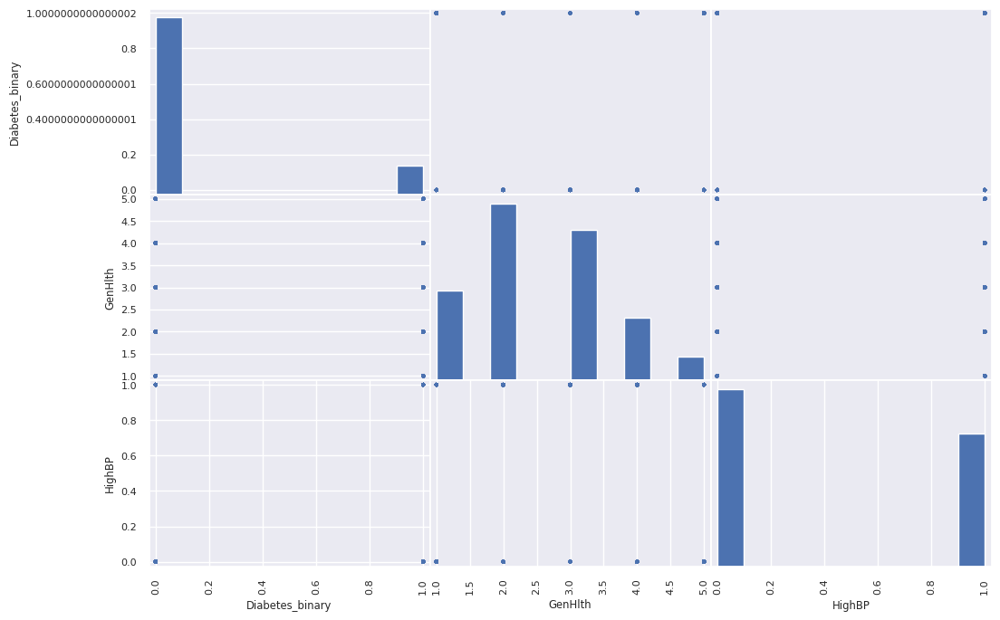

In [60]:
attributes = ['Diabetes_binary', 'GenHlth', 'HighBP']
scatter_matrix(cdc_df[attributes], figsize=(12, 8))

array([[<Axes: xlabel='Diabetes_binary', ylabel='Diabetes_binary'>,
        <Axes: xlabel='DiffWalk', ylabel='Diabetes_binary'>,
        <Axes: xlabel='BMI', ylabel='Diabetes_binary'>,
        <Axes: xlabel='HighChol', ylabel='Diabetes_binary'>],
       [<Axes: xlabel='Diabetes_binary', ylabel='DiffWalk'>,
        <Axes: xlabel='DiffWalk', ylabel='DiffWalk'>,
        <Axes: xlabel='BMI', ylabel='DiffWalk'>,
        <Axes: xlabel='HighChol', ylabel='DiffWalk'>],
       [<Axes: xlabel='Diabetes_binary', ylabel='BMI'>,
        <Axes: xlabel='DiffWalk', ylabel='BMI'>,
        <Axes: xlabel='BMI', ylabel='BMI'>,
        <Axes: xlabel='HighChol', ylabel='BMI'>],
       [<Axes: xlabel='Diabetes_binary', ylabel='HighChol'>,
        <Axes: xlabel='DiffWalk', ylabel='HighChol'>,
        <Axes: xlabel='BMI', ylabel='HighChol'>,
        <Axes: xlabel='HighChol', ylabel='HighChol'>]], dtype=object)

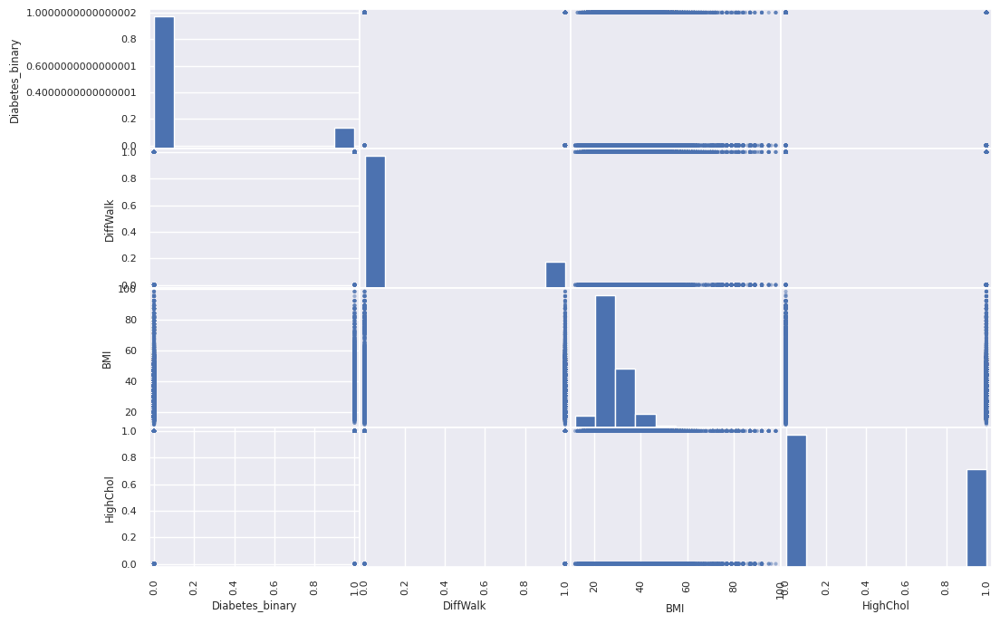

In [61]:
attributes = ['Diabetes_binary', 'DiffWalk', 'BMI', 'HighChol']
scatter_matrix(cdc_df[attributes], figsize=(12, 8))

array([[<Axes: xlabel='Diabetes_binary', ylabel='Diabetes_binary'>,
        <Axes: xlabel='GenHlth', ylabel='Diabetes_binary'>,
        <Axes: xlabel='HighBP', ylabel='Diabetes_binary'>,
        <Axes: xlabel='DiffWalk', ylabel='Diabetes_binary'>,
        <Axes: xlabel='BMI', ylabel='Diabetes_binary'>,
        <Axes: xlabel='HighChol', ylabel='Diabetes_binary'>],
       [<Axes: xlabel='Diabetes_binary', ylabel='GenHlth'>,
        <Axes: xlabel='GenHlth', ylabel='GenHlth'>,
        <Axes: xlabel='HighBP', ylabel='GenHlth'>,
        <Axes: xlabel='DiffWalk', ylabel='GenHlth'>,
        <Axes: xlabel='BMI', ylabel='GenHlth'>,
        <Axes: xlabel='HighChol', ylabel='GenHlth'>],
       [<Axes: xlabel='Diabetes_binary', ylabel='HighBP'>,
        <Axes: xlabel='GenHlth', ylabel='HighBP'>,
        <Axes: xlabel='HighBP', ylabel='HighBP'>,
        <Axes: xlabel='DiffWalk', ylabel='HighBP'>,
        <Axes: xlabel='BMI', ylabel='HighBP'>,
        <Axes: xlabel='HighChol', ylabel='HighBP'>],
    

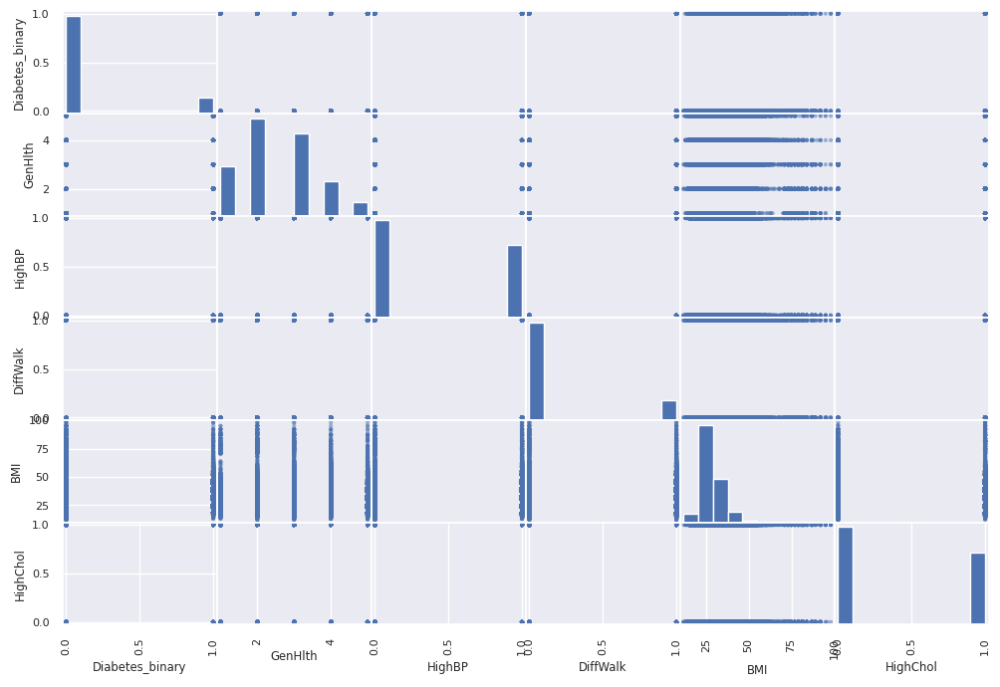

In [62]:
attributes = ['Diabetes_binary', 'GenHlth', 'HighBP', 'DiffWalk',
              'BMI', 'HighChol']
scatter_matrix(cdc_df[attributes], figsize=(12, 8))

In [63]:
# Separate the features into one matrix
df_features = X.copy()
df_features

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1,1,1,40,1,0,0,0,0,1,...,1,0,5,18,15,1,0,9,4,3
1,0,0,0,25,1,0,0,1,0,0,...,0,1,3,0,0,0,0,7,6,1
2,1,1,1,28,0,0,0,0,1,0,...,1,1,5,30,30,1,0,9,4,8
3,1,0,1,27,0,0,0,1,1,1,...,1,0,2,0,0,0,0,11,3,6
4,1,1,1,24,0,0,0,1,1,1,...,1,0,2,3,0,0,0,11,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1,1,1,45,0,0,0,0,1,1,...,1,0,3,0,5,0,1,5,6,7
253676,1,1,1,18,0,0,0,0,0,0,...,1,0,4,0,0,1,0,11,2,4
253677,0,0,1,28,0,0,0,1,1,0,...,1,0,1,0,0,0,0,2,5,2
253678,1,0,1,23,0,0,0,0,1,1,...,1,0,3,0,0,0,1,7,5,1


In [64]:
# Separate the classes into one matrix
df_class = y.copy()
df_class

,Diabetes_binary
0,0
1,0
2,0
3,0
4,0
...,...
253675,0
253676,1
253677,0
253678,0


In [65]:
# Scale them to enable ANOVA
df_features.HighBP = scale(df_features.HighBP)
df_features.HighChol = scale(df_features.HighChol)
df_features.CholCheck = scale(df_features.CholCheck)
df_features.BMI = scale(df_features.BMI)
df_features.Smoker = scale(df_features.Smoker)
df_features.Stroke = scale(df_features.Stroke)
df_features.HeartDiseaseorAttack = scale(df_features.HeartDiseaseorAttack)
df_features.PhysActivity = scale(df_features.PhysActivity)
df_features.Fruits = scale(df_features.Fruits)
df_features.Veggies = scale(df_features.Veggies)
df_features.HvyAlcoholConsump = scale(df_features.HvyAlcoholConsump)
df_features.AnyHealthcare = scale(df_features.AnyHealthcare)
df_features.NoDocbcCost = scale(df_features.NoDocbcCost)
df_features.GenHlth = scale(df_features.GenHlth)
df_features.MentHlth = scale(df_features.MentHlth)
df_features.PhysHlth = scale(df_features.PhysHlth)
df_features.DiffWalk = scale(df_features.DiffWalk)
df_features.Sex = scale(df_features.Sex)
df_features.Age = scale(df_features.Age)
df_features.Education = scale(df_features.Education)
df_features.Income = scale(df_features.Income)

df_features

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1.153688,1.165254,0.196922,1.757936,1.120927,-0.205637,-0.322458,-1.762814,-1.316872,0.482087,...,0.226863,-0.303173,2.329121,1.998592,1.233999,2.223615,-0.887021,0.316900,-1.065595,-1.474487
1,-0.866785,-0.858182,-5.078164,-0.511806,1.120927,-0.205637,-0.322458,0.567275,-1.316872,-2.074316,...,-4.407954,3.298445,0.457294,-0.429630,-0.486592,-0.449718,-0.887021,-0.337933,0.963272,-2.440138
2,1.153688,1.165254,0.196922,-0.057858,-0.892119,-0.205637,-0.322458,-1.762814,0.759375,-2.074316,...,0.226863,3.298445,2.329121,3.617407,2.954590,2.223615,-0.887021,0.316900,-1.065595,0.939638
3,1.153688,-0.858182,0.196922,-0.209174,-0.892119,-0.205637,-0.322458,0.567275,0.759375,0.482087,...,0.226863,-0.303173,-0.478619,-0.429630,-0.486592,-0.449718,-0.887021,0.971733,-2.080028,-0.026012
4,1.153688,1.165254,0.196922,-0.663122,-0.892119,-0.205637,-0.322458,0.567275,0.759375,0.482087,...,0.226863,-0.303173,-0.478619,-0.024926,-0.486592,-0.449718,-0.887021,0.971733,-0.051162,-0.991662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1.153688,1.165254,0.196922,2.514516,-0.892119,-0.205637,-0.322458,-1.762814,0.759375,0.482087,...,0.226863,-0.303173,0.457294,-0.429630,0.086938,-0.449718,1.127369,-0.992766,0.963272,0.456813
253676,1.153688,1.165254,0.196922,-1.571019,-0.892119,-0.205637,-0.322458,-1.762814,-1.316872,-2.074316,...,0.226863,-0.303173,1.393207,-0.429630,-0.486592,2.223615,-0.887021,0.971733,-3.094461,-0.991662
253677,-0.866785,-0.858182,0.196922,-0.057858,-0.892119,-0.205637,-0.322458,0.567275,0.759375,-2.074316,...,0.226863,-0.303173,-1.414532,-0.429630,-0.486592,-0.449718,-0.887021,-1.975015,-0.051162,-1.957312
253678,1.153688,-0.858182,0.196922,-0.814438,-0.892119,-0.205637,-0.322458,-1.762814,0.759375,0.482087,...,0.226863,-0.303173,0.457294,-0.429630,-0.486592,-0.449718,1.127369,-0.337933,-0.051162,-2.440138


Number of probable clusters is: 8


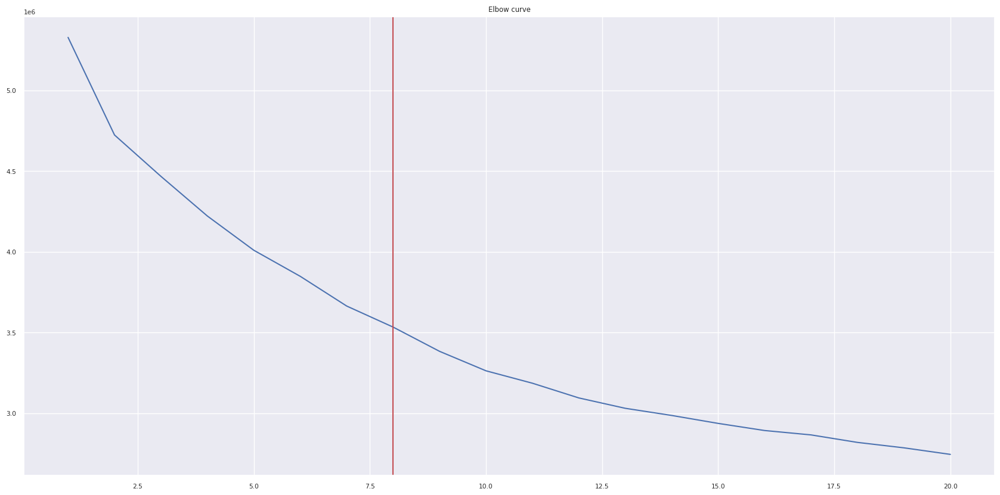

In [66]:
# NB - leave the imports here as there are issues pulling them at
# the start currently.  Look into this later.
# NB - swap off the numpy errors later
warnings.filterwarnings('ignore', message='not allowed')
warnings.simplefilter(action='ignore', category=FutureWarning)

df_3 = df_features
df_3 = pd.DataFrame(df_3)
df_3 = df_3.T
df_3 = df_3.values.tolist()

X = df_features
distort = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    distort.append(kmeans.inertia_)

kmin, kmax = 1, 21  # Create instances
elbow_inst = elbow(df_3, kmin, kmax)  # set,
elbow_inst.process()  # process
amount_c = elbow_inst.get_amount()  # most likely amount of clusters
wce = elbow_inst.get_wce()    # wce

a = amount_c  # feed amount of clusters in to print on graph
b = a-1  # for the lower slice val
x_mark = distort[b:a]  # create to point and plot of graph of elbows

fig = plt.figure(figsize=(21, 10))
plt.plot(range(1, 21), distort)
plt.grid(True)
# Draw red line where calculated amount of clusters cross through
plt.axvline(x=amount_c, color="r")
plt.title('Elbow curve')
print("Number of probable clusters is:", amount_c)

In [67]:
# Compare what the numbers of classes there are to compare:
total_class = df_class.groupby('Diabetes_binary')["Diabetes_binary"].count()
total_class = pd.DataFrame(total_class)
# Count here is three; similar the first three features
print("Total clusters predicted by the elbow method are", amount_c)
print("Total class number in the dataset ",
      total_class.count().Diabetes_binary)

Total clusters predicted by the elbow method are 8
Total class number in the dataset  2


In [ ]:
# more clustering (K means)

In [68]:
# Perform K Mean on dataset, full.
dfall = df_features
X = np.array(dfall)
kmeans = KMeans(n_clusters=amount_c)  # number of clusters to find;
# we think (varies) based on previous
kmeans.fit(X)  # fit the data
centroids = kmeans.cluster_centers_
labels = kmeans.labels_

In [69]:
# Feed this in, and report on the purity score
print("The purity score is:", purity_score(labels, df_class))
print("The purity score, rounded to three digits is:",
      purity_score(labels, df_class).round(3))

The purity score is: 0.36428965625985493
The purity score, rounded to three digits is: 0.364


In [70]:
# Create a 'comparison dataframe' to work with here
df_compare = df_features
df_compare = pd.DataFrame(df_compare)
df_compare = df_features.sample(n=10, random_state=1)
# make larger later, this is just testing
df_compare = df_compare.T
df_compare = df_compare.values.tolist()

In [71]:
df_features.columns

Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [72]:
df_compare

[[1.1536881440397224,
  -0.8667853658428245,
  1.1536881440397224,
  1.1536881440397224,
  -0.8667853658428245,
  1.1536881440397224,
  1.1536881440397224,
  -0.8667853658428245,
  -0.8667853658428245,
  1.1536881440397224],
 [-0.8581816299667511,
  -0.8581816299667511,
  1.1652544928498918,
  -0.8581816299667511,
  -0.8581816299667511,
  1.1652544928498918,
  1.1652544928498918,
  -0.8581816299667511,
  -0.8581816299667511,
  -0.8581816299667511],
 [0.19692156005595848,
  0.19692156005595848,
  0.19692156005595848,
  0.19692156005595848,
  0.19692156005595848,
  0.19692156005595848,
  0.19692156005595848,
  0.19692156005595848,
  0.19692156005595848,
  0.19692156005595848],
 [-0.8144383825703527,
  -0.9657545035039171,
  -0.3604900197696594,
  1.6066195523666782,
  -0.9657545035039171,
  -0.3604900197696594,
  1.455303431433114,
  -0.5118061407032238,
  -0.9657545035039171,
  -0.8144383825703527],
 [1.1209271907688618,
  1.1209271907688618,
  1.1209271907688618,
  -0.8921186034519192,

Need to use multidm & X means a Kmeans

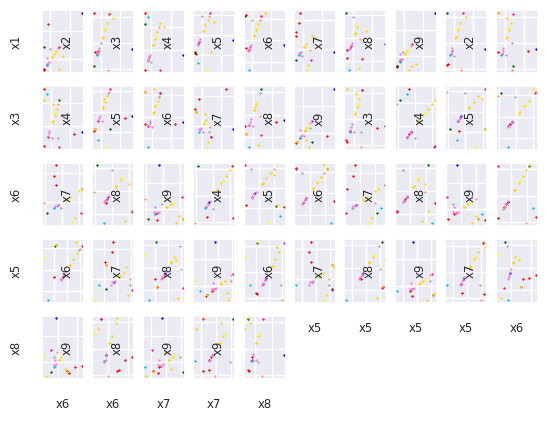

In [ ]:
np.warnings = warnings

centers = kmeans_plusplus_initializer(df_compare, amount_c).initialize()
# using the elbow idea
xmeans_instance = xmeans(df_compare, centers)
xmeans_instance.process()
clusters = xmeans_instance.get_clusters()
visualizer = cluster_visualizer_multidim()
visualizer.append_clusters(clusters, df_compare, marker='*', markersize=1)
visualizer.show(max_row_size=10)

Total WCE: 30.61961677403432


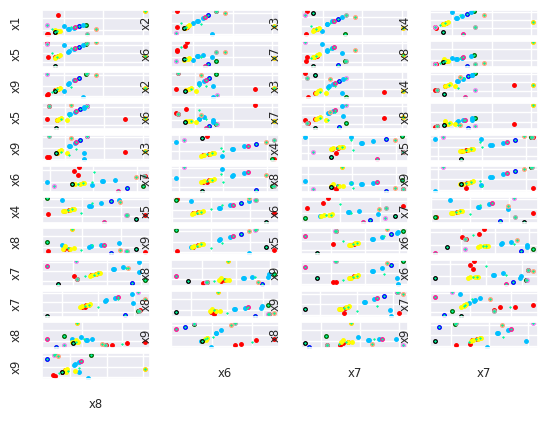

In [ ]:
amount_initial_centers = amount_c
initial_centers = kmeans_plusplus_initializer(df_compare,
                                              amount_initial_centers
                                              ).initialize()
xmeans_instance = xmeans(df_compare, initial_centers, 20)
xmeans_instance.process()
clusters = xmeans_instance.get_clusters()
centers = xmeans_instance.get_centers()
print("Total WCE:", xmeans_instance.get_total_wce())
visualizer = cluster_visualizer_multidim()
visualizer.append_clusters(clusters, df_compare)
visualizer.append_cluster(centers, None, marker='*', markersize=1)
visualizer.show()

Try with larger amounts, check time to see how

In [ ]:
# Create a 'comparison dataframe' to work with here
df_compare = df_features
df_compare = pd.DataFrame(df_compare)
df_compare = df_features.sample(n=100, random_state=1)
# make larger later, this is just testing
df_compare = df_compare.T
df_compare = df_compare.values.tolist()

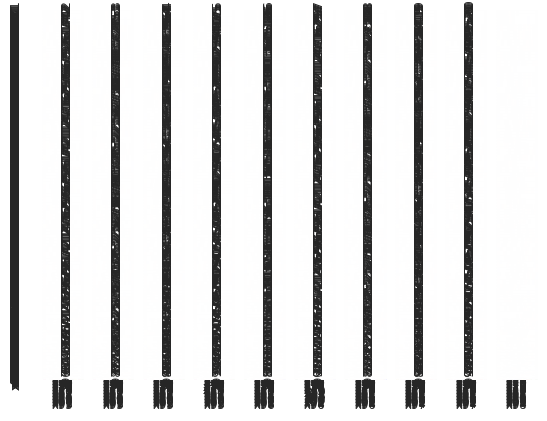

In [ ]:
centers = kmeans_plusplus_initializer(df_compare, amount_c).initialize()
# using the elbow idea
xmeans_instance = xmeans(df_compare, centers)
xmeans_instance.process()
clusters = xmeans_instance.get_clusters()
visualizer = cluster_visualizer_multidim()
visualizer.append_clusters(clusters, df_compare, marker='*', markersize=1)
visualizer.show(max_row_size=10)

Total WCE: 536.4400330567273


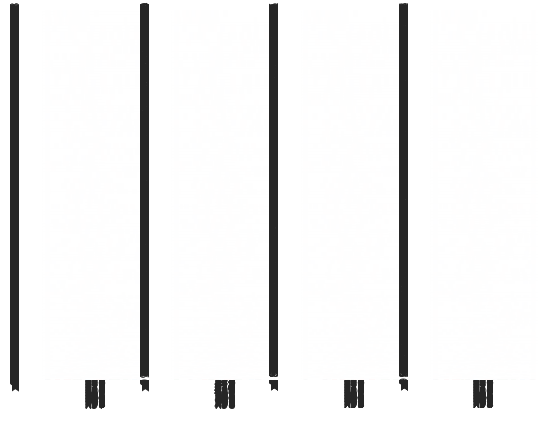

In [ ]:
amount_initial_centers = amount_c
initial_centers = kmeans_plusplus_initializer(df_compare,
                                              amount_initial_centers
                                              ).initialize()
xmeans_instance = xmeans(df_compare, initial_centers, 20)
xmeans_instance.process()
clusters = xmeans_instance.get_clusters()
centers = xmeans_instance.get_centers()
print("Total WCE:", xmeans_instance.get_total_wce())
visualizer = cluster_visualizer_multidim()
visualizer.append_clusters(clusters, df_compare)
visualizer.append_cluster(centers, None, marker='*', markersize=1)
visualizer.show()

In [ ]:
# use ANOVA to select best three features for k-means

In [73]:
# We will run f_oneway analysis on each feature, to do anova testing.
an_HighBP = stats.f_oneway(cdc_df.HighBP, cdc_df.Diabetes_binary)
an_HighChol = stats.f_oneway(cdc_df.HighChol, cdc_df.Diabetes_binary)
an_CholCheck = stats.f_oneway(cdc_df.CholCheck, cdc_df.Diabetes_binary)
an_BMI = stats.f_oneway(cdc_df.BMI, cdc_df.Diabetes_binary)
an_Smoker = stats.f_oneway(cdc_df.Smoker, cdc_df.Diabetes_binary)
an_Stroke = stats.f_oneway(cdc_df.Stroke, cdc_df.Diabetes_binary)
an_HeartDiseaseorAttack = stats.f_oneway(cdc_df.HeartDiseaseorAttack,
                                         cdc_df.Diabetes_binary)
an_PhysActivity = stats.f_oneway(cdc_df.PhysActivity, cdc_df.Diabetes_binary)
an_Fruits = stats.f_oneway(cdc_df.Fruits, cdc_df.Diabetes_binary)
an_Veggies = stats.f_oneway(cdc_df.Veggies, cdc_df.Diabetes_binary)
an_HvyAlcoholConsump = stats.f_oneway(cdc_df.HvyAlcoholConsump,
                                      cdc_df.Diabetes_binary)
an_AnyHealthcare = stats.f_oneway(cdc_df.AnyHealthcare, cdc_df.Diabetes_binary)
an_NoDocbcCost = stats.f_oneway(cdc_df.NoDocbcCost, cdc_df.Diabetes_binary)
an_GenHlth = stats.f_oneway(cdc_df.GenHlth, cdc_df.Diabetes_binary)
an_MentHlth = stats.f_oneway(cdc_df.MentHlth, cdc_df.Diabetes_binary)
an_PhysHlth = stats.f_oneway(cdc_df.PhysHlth, cdc_df.Diabetes_binary)
an_DiffWalk = stats.f_oneway(cdc_df.DiffWalk, cdc_df.Diabetes_binary)
an_Sex = stats.f_oneway(cdc_df.Sex, cdc_df.Diabetes_binary)
an_Age = stats.f_oneway(cdc_df.Age, cdc_df.Diabetes_binary)
an_Education = stats.f_oneway(cdc_df.Education, cdc_df.Diabetes_binary)

In [74]:
# Turn the results into a table of results that are easier to
# read than individual outputs. Rename.
f_vals = [an_HighBP[1], an_HighChol[1], an_CholCheck[1], an_BMI[1],
          an_Smoker[1], an_Stroke[1], an_HeartDiseaseorAttack[1],
          an_PhysActivity[1], an_Fruits[1], an_Veggies[1],
          an_HvyAlcoholConsump[1], an_AnyHealthcare[1],
          an_NoDocbcCost[1], an_GenHlth[1], an_MentHlth[1], an_PhysHlth[1],
          an_DiffWalk[1], an_Sex[1], an_Age[1], an_Education[1]]
f_vals = pd.DataFrame(f_vals)
statistic = [an_HighBP[0], an_HighChol[0], an_CholCheck[0], an_BMI[0],
             an_Smoker[0], an_Stroke[0], an_HeartDiseaseorAttack[0],
             an_PhysActivity[0], an_Fruits[0], an_Veggies[0],
             an_HvyAlcoholConsump[0], an_AnyHealthcare[0], an_NoDocbcCost[0],
             an_GenHlth[0], an_MentHlth[0], an_PhysHlth[0], an_DiffWalk[0],
             an_Sex[0], an_Age[0], an_Education[0]]
statistic = pd.DataFrame(statistic)

f_vals.rename(columns={0: 'F_Value'},
              index={0: 'HighBP', 1: 'HighChol', 2: 'CholCheck', 3: 'BMI',
                     4: 'Smoker', 5: 'Stroke', 6: 'HeartDiseaseorAttack',
                     7: 'PhysActivity', 8: 'Fruits', 9: 'Veggies',
                     10: 'HvyAlcoholConsump', 11: 'AnyHealthcare',
                     12: 'NoDocbcCost', 13: 'GenHlth', 14: 'MentHlth',
                     15: 'PhysHlth', 16: 'DiffWalk',
                     17: 'Sex', 18: 'Age', 19: 'Education', 20: 'Income'},
              inplace=True)
statistic.rename(columns={0: 'Statistic'},
                 index={0: 'HighBP', 1: 'HighChol', 2: 'CholCheck', 3: 'BMI',
                        4: 'Smoker', 5: 'Stroke', 6: 'HeartDiseaseorAttack',
                        7: 'PhysActivity', 8: 'Fruits', 9: 'Veggies',
                        10: 'HvyAlcoholConsump', 11: 'AnyHealthcare',
                        12: 'NoDocbcCost', 13: 'GenHlth', 14: 'MentHlth',
                        15: 'PhysHlth', 16: 'DiffWalk',
                        17: 'Sex', 18: 'Age', 19: 'Education', 20: 'Income'},
                 inplace=True)

vals = f_vals['F_Value'], statistic['Statistic']

vals = pd.DataFrame(vals)
vals = vals.T
vals

,F_Value,Statistic
HighBP,0.000000e+00,5.833612e+04
HighChol,0.000000e+00,5.649804e+04
CholCheck,0.000000e+00,1.103354e+06
BMI,0.000000e+00,4.620476e+06
Smoker,0.000000e+00,6.386504e+04
Stroke,0.000000e+00,1.557740e+04
HeartDiseaseorAttack,0.000000e+00,2.519424e+03
PhysActivity,0.000000e+00,3.177812e+05
Fruits,0.000000e+00,1.765821e+05
Veggies,0.000000e+00,4.198295e+05


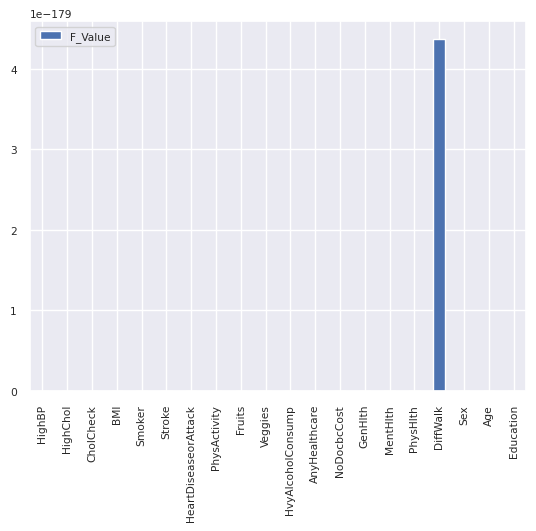

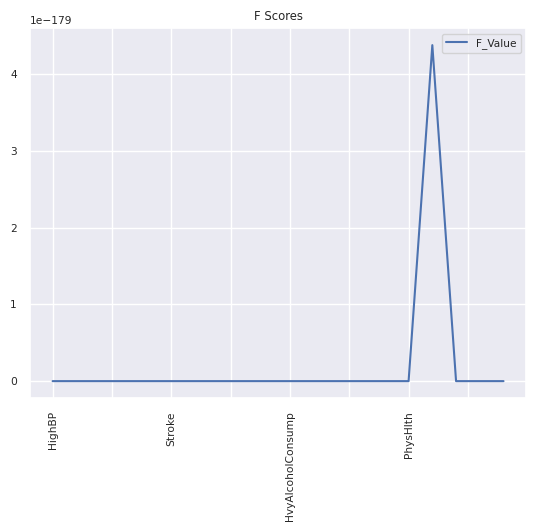

In [75]:
# Plot a bar and a line graph of the results
f_vals.plot.bar()
f_vals.plot()
plt.title('F Scores')
plt.xticks(rotation=90)
plt.show()

In [76]:
# Decide on the top three features
print("Anova is Analysis of Variance: For this, we would choose top three,")
print("with the highest values, so it is closest to being significantly ")
print("differant, and thereby closest to being greater than α(0.05);")
print("The largest three are (on this run):")
vals.sort_values('F_Value', ascending=False).head(3)

Anova is Analysis of Variance: For this, we would choose top three,
with the highest values, so it is closest to being significantly 
differant, and thereby closest to being greater than α(0.05);
The largest three are (on this run):


,F_Value,Statistic
DiffWalk,4.376083e-179,814.871385
HighBP,0.000000e+00,58336.122643
HighChol,0.000000e+00,56498.040609


In [77]:
# Decide on the top five features - potentially, we can vary more
print("Anova is Analysis of Variance: For this, we would choose top five,")
print("with the highest values, so it is closest to being significantly ")
print("differant, and thereby closest to being greater than α(0.05);")
print("The largest three are (on this run):")
vals.sort_values('F_Value', ascending=False).head(5)

Anova is Analysis of Variance: For this, we would choose top five,
with the highest values, so it is closest to being significantly 
differant, and thereby closest to being greater than α(0.05);
The largest three are (on this run):


,F_Value,Statistic
DiffWalk,4.376083e-179,8.148714e+02
HighBP,0.000000e+00,5.833612e+04
HighChol,0.000000e+00,5.649804e+04
Age,0.000000e+00,1.672625e+06
Sex,0.000000e+00,6.273870e+04


In [126]:
correl_abs.sort_values(ascending=False).head(6)

Diabetes_binary    1.000000
GenHlth            0.293569
HighBP             0.263129
DiffWalk           0.218344
BMI                0.216843
HighChol           0.200276
Name: Diabetes_binary, dtype: float64

In [78]:
# Use the above table to select the correct items, and
# feed into the next dataframe
anos = vals.sort_values('F_Value', ascending=False).head(3)
anos = pd.DataFrame(anos.index)
one = (anos.loc[0, 0])
two = (anos.loc[1, 0])
three = (anos.loc[2, 0])

In [79]:
# Pull the fields, create dataframe of best three features from previous run.
dfano = cdc_df_2[one], cdc_df_2[two], cdc_df_2[three]
dfano = pd.DataFrame(dfano)
dfano = dfano.T
dfano = dfano.values.tolist()

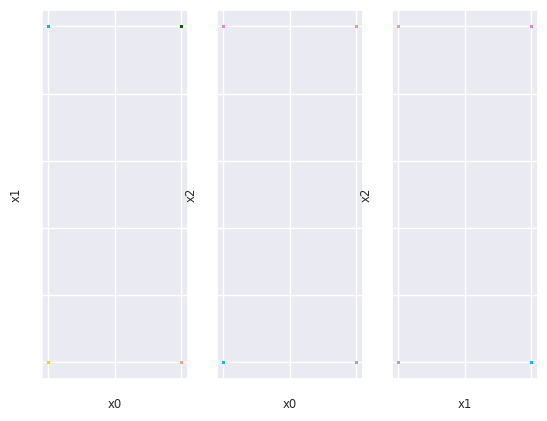

In [82]:
centers = kmeans_plusplus_initializer(dfano, amount_c).initialize()
# using the elbow idea
xmeans_instance = xmeans(dfano, centers)
xmeans_instance.process()
clusters = xmeans_instance.get_clusters()
visualizer = cluster_visualizer_multidim()
visualizer.append_clusters(clusters, dfano, marker='*', markersize=1)
visualizer.show(max_row_size=10)

Total WCE: 0.0


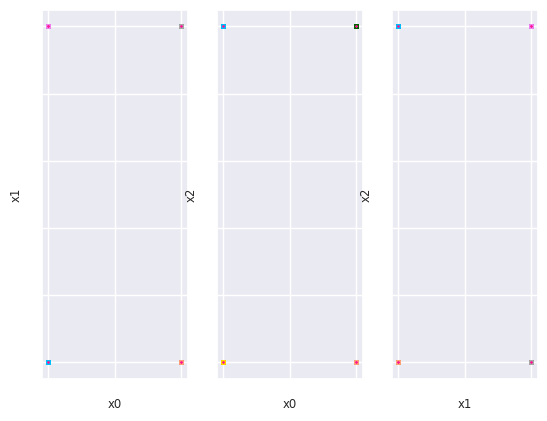

In [83]:
amount_initial_centers = amount_c
initial_centers = kmeans_plusplus_initializer(dfano,
                                              amount_initial_centers
                                              ).initialize()
xmeans_instance = xmeans(dfano, initial_centers, 20)
xmeans_instance.process()
clusters = xmeans_instance.get_clusters()
centers = xmeans_instance.get_centers()
print("Total WCE:", xmeans_instance.get_total_wce())
visualizer = cluster_visualizer_multidim()
visualizer.append_clusters(clusters, dfano)
visualizer.append_cluster(centers, None, marker='*', markersize=1)
visualizer.show()

In [ ]:
# feature analysis - what is best?

In [84]:
# Import the dataset
cdc_diabetes_health_indicators = fetch_ucirepo(id=891)
# grab in the data as X - features, and y - targets (Diabetes class;
# 0, no Diabetes, 1 - Diabetic or Prediabetic)
X = cdc_diabetes_health_indicators.data.features
y = cdc_diabetes_health_indicators.data.targets
# Check out the details
print(cdc_diabetes_health_indicators.metadata)
print(cdc_diabetes_health_indicators.variables)

{'uci_id': 891, 'name': 'CDC Diabetes Health Indicators', 'repository_url': 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators', 'data_url': 'https://archive.ics.uci.edu/static/public/891/data.csv', 'abstract': 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy. ', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular', 'Multivariate'], 'num_instances': 253680, 'num_features': 21, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Sex', 'Age', 'Education Level', 'Income'], 'target_col': ['Diabetes_binary'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_

In [85]:
X = cdc_diabetes_health_indicators.data.features
y = cdc_diabetes_health_indicators.data.targets

In [86]:
X

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1,1,1,40,1,0,0,0,0,1,...,1,0,5,18,15,1,0,9,4,3
1,0,0,0,25,1,0,0,1,0,0,...,0,1,3,0,0,0,0,7,6,1
2,1,1,1,28,0,0,0,0,1,0,...,1,1,5,30,30,1,0,9,4,8
3,1,0,1,27,0,0,0,1,1,1,...,1,0,2,0,0,0,0,11,3,6
4,1,1,1,24,0,0,0,1,1,1,...,1,0,2,3,0,0,0,11,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1,1,1,45,0,0,0,0,1,1,...,1,0,3,0,5,0,1,5,6,7
253676,1,1,1,18,0,0,0,0,0,0,...,1,0,4,0,0,1,0,11,2,4
253677,0,0,1,28,0,0,0,1,1,0,...,1,0,1,0,0,0,0,2,5,2
253678,1,0,1,23,0,0,0,0,1,1,...,1,0,3,0,0,0,1,7,5,1


In [87]:
y

,Diabetes_binary
0,0
1,0
2,0
3,0
4,0
...,...
253675,0
253676,1
253677,0
253678,0


In [88]:
# Import the dataset
cdc_diabetes_health_indicators = fetch_ucirepo(id=891)
# grab in the data as X - features, and y - targets (Diabetes class;
# 0, no Diabetes, 1 - Diabetic or Prediabetic)
X = cdc_diabetes_health_indicators.data.features
y = cdc_diabetes_health_indicators.data.targets
# Check out the details
print(cdc_diabetes_health_indicators.metadata)
print(cdc_diabetes_health_indicators.variables)

{'uci_id': 891, 'name': 'CDC Diabetes Health Indicators', 'repository_url': 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators', 'data_url': 'https://archive.ics.uci.edu/static/public/891/data.csv', 'abstract': 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy. ', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular', 'Multivariate'], 'num_instances': 253680, 'num_features': 21, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Sex', 'Age', 'Education Level', 'Income'], 'target_col': ['Diabetes_binary'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_

In [89]:
# Split the training set - 80% Train, 20% Test/Validation (so 80/10/10)
# Split off the test and training set
x_train, x_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.1,
                                                    shuffle=True)

# Split off to get the validation sets
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                  test_size=1/9)
print("Test, train and validation sets created")

print("The shape of the data are:")
# Check the shapes are actually correct:
print("X_train shape: {}".format(x_train.shape))
print("y_train shape: {}".format(y_train.shape))

print("X_test shape: {}".format(x_test.shape))
print("y_test shape: {}".format(y_test.shape))

print("X_val shape: {}".format(x_val.shape))
print("y val shape: {}".format(y_val.shape))
print("------------------")

print("Converting to tensorflow")
x_train = tf.convert_to_tensor(x_train)
x_test = tf.convert_to_tensor(x_test)
y_train = tf.convert_to_tensor(y_train)
y_test = tf.convert_to_tensor(y_test)
x_val = tf.convert_to_tensor(x_val)
y_val = tf.convert_to_tensor(y_val)

print("Converted to tensorflow")
print("------------------")
print("The shape of the data are:")

print("X_train shape: {}".format(x_train.shape))
print("y_train shape: {}".format(y_train.shape))

print("X_test shape: {}".format(x_test.shape))
print("y_test shape: {}".format(y_test.shape))

print("X_val shape: {}".format(x_val.shape))
print("y val shape: {}".format(y_val.shape))
print("------------------")
print("The data has been preprocessed")

Test, train and validation sets created
The shape of the data are:
X_train shape: (202944, 21)
y_train shape: (202944, 1)
X_test shape: (25368, 21)
y_test shape: (25368, 1)
X_val shape: (25368, 21)
y val shape: (25368, 1)
------------------
Converting to tensorflow
Converted to tensorflow
------------------
The shape of the data are:
X_train shape: (202944, 21)
y_train shape: (202944, 1)
X_test shape: (25368, 21)
y_test shape: (25368, 1)
X_val shape: (25368, 21)
y val shape: (25368, 1)
------------------
The data has been preprocessed


In [90]:
# Create model
network = models.Sequential([
                            layers.Dense(8, activation='relu',
                                         input_shape=(21,)),
                            layers.Dense(12, activation="relu"),
                            layers.Dense(16, activation="relu"),
                            layers.Dense(2, activation='softmax')]
                            )
# Plot the model and display the image

sample_weight_mode = 0.001

plot_model(model=network,
           to_file='model.png',
           show_shapes=True,
           show_layer_names=True,
           rankdir='LR',
           expand_nested=True)
# Print the summary of the network
network.summary()
# Compile the model
network.compile(optimizer="rmsprop",
                loss="sparse_categorical_crossentropy",
                metrics=["accuracy"])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 176       
                                                                 
 dense_1 (Dense)             (None, 12)                108       
                                                                 
 dense_2 (Dense)             (None, 16)                208       
                                                                 
 dense_3 (Dense)             (None, 2)                 34        
                                                                 
Total params: 526 (2.05 KB)
Trainable params: 526 (2.05 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [91]:
# Fit the model now
init_weights = network.get_weights()

history = network.fit(
                    x_train,
                    y_train,
                    epochs=100,
                    batch_size=128,
                    validation_data=(x_val, y_val),
                    )

Epoch 1/100
1586/1586 [==============================] - 5s 3ms/step - loss: 0.3547 - accuracy: 0.8581 - val_loss: 0.3378 - val_accuracy: 0.8610
Epoch 2/100
1586/1586 [==============================] - 4s 3ms/step - loss: 0.3269 - accuracy: 0.8633 - val_loss: 0.3219 - val_accuracy: 0.8639
Epoch 3/100
1586/1586 [==============================] - 4s 3ms/step - loss: 0.3226 - accuracy: 0.8640 - val_loss: 0.3237 - val_accuracy: 0.8617
Epoch 4/100
1586/1586 [==============================] - 4s 3ms/step - loss: 0.3207 - accuracy: 0.8647 - val_loss: 0.3233 - val_accuracy: 0.8617
Epoch 5/100
1586/1586 [==============================] - 4s 3ms/step - loss: 0.3194 - accuracy: 0.8649 - val_loss: 0.3229 - val_accuracy: 0.8633
Epoch 6/100
1586/1586 [==============================] - 4s 3ms/step - loss: 0.3184 - accuracy: 0.8653 - val_loss: 0.3178 - val_accuracy: 0.8642
Epoch 7/100
1586/1586 [==============================] - 4s 3ms/step - loss: 0.3176 - accuracy: 0.8652 - val_loss: 0.3188 - val_ac

------------------
Model accuracy
------------------


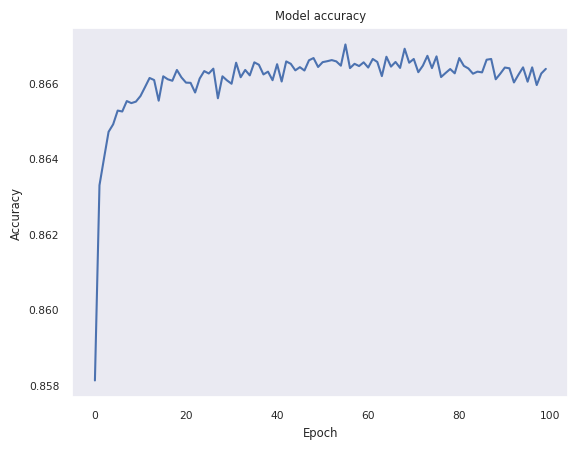

------------------
Training and Validation accuracy
------------------


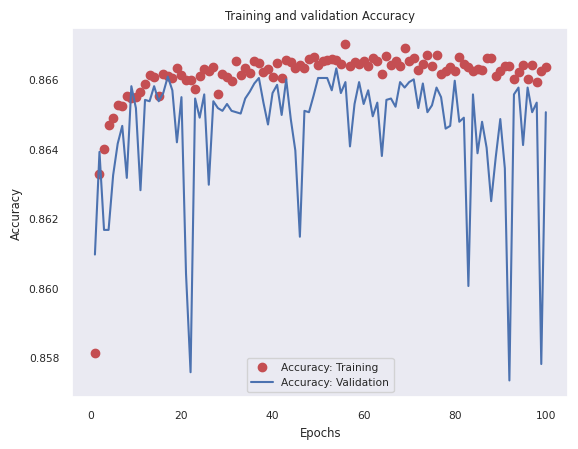

In [92]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


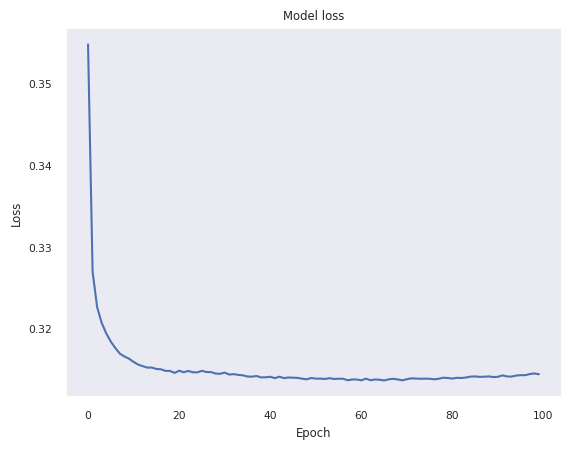

------------------
Training and Validation loss
------------------


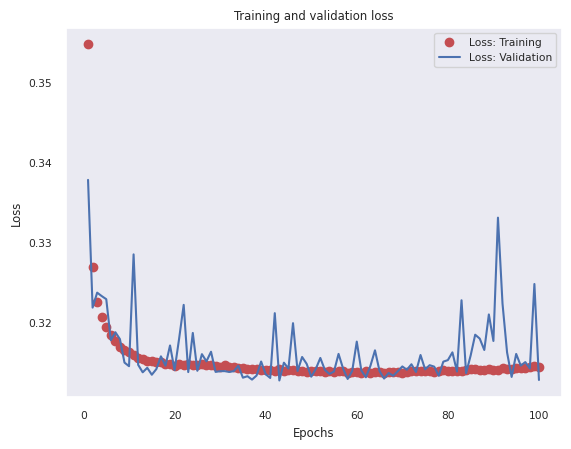

In [93]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [94]:
# print results
print("------------------")
print("RESULTS")
test_loss, test_acc = network.evaluate(x_test, y_test)
print(f'test_loss: {test_loss}')
print(f'test_acc: {test_acc}')
print("------------------")
results = network.evaluate(x_test, y_test)
results
print("------------------")

------------------
RESULTS
793/793 [==============================] - 1s 1ms/step - loss: 0.3153 - accuracy: 0.8648
test_loss: 0.31525808572769165
test_acc: 0.8647902607917786
------------------
793/793 [==============================] - 1s 2ms/step - loss: 0.3153 - accuracy: 0.8648
------------------


In [95]:
# Set up for logging
root_logdir = "logs"
run_id = datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = os.path.join(root_logdir, run_id)

!rm -rf ./logs/
file_writer = tf.summary.create_file_writer(logdir)

# Set up the callbacks
callbacks = [
    tf.keras.callbacks.TensorBoard(
        log_dir=logdir,
        histogram_freq=1
    )
]

# Set up the model; to run
network.set_weights(init_weights)
init_weights = network.get_weights()
history = network.fit(x_train,
                      y_train,
                      epochs=100,
                      batch_size=128,
                      callbacks=callbacks,
                      validation_data=(x_val, y_val))

Epoch 1/100
1586/1586 [==============================] - 5s 3ms/step - loss: 0.3544 - accuracy: 0.8578 - val_loss: 0.3306 - val_accuracy: 0.8624
Epoch 2/100
1586/1586 [==============================] - 5s 3ms/step - loss: 0.3268 - accuracy: 0.8634 - val_loss: 0.3248 - val_accuracy: 0.8645
Epoch 3/100
1586/1586 [==============================] - 5s 3ms/step - loss: 0.3237 - accuracy: 0.8640 - val_loss: 0.3211 - val_accuracy: 0.8641
Epoch 4/100
1586/1586 [==============================] - 5s 3ms/step - loss: 0.3216 - accuracy: 0.8642 - val_loss: 0.3263 - val_accuracy: 0.8643
Epoch 5/100
1586/1586 [==============================] - 5s 3ms/step - loss: 0.3201 - accuracy: 0.8644 - val_loss: 0.3178 - val_accuracy: 0.8641
Epoch 6/100
1586/1586 [==============================] - 5s 3ms/step - loss: 0.3187 - accuracy: 0.8648 - val_loss: 0.3248 - val_accuracy: 0.8633
Epoch 7/100
1586/1586 [==============================] - 5s 3ms/step - loss: 0.3177 - accuracy: 0.8651 - val_loss: 0.3170 - val_ac

In [ ]:
# boot into the tensorboard and display
%load_ext tensorboard
%tensorboard --logdir logs

In [99]:
# Add in a dropout layer after each layer
network_drop = models.Sequential([layers.Dense(8,
                                               activation='relu',
                                               input_shape=(21,)
                                               ),
                                  layers.Dropout(0.05),
                                  layers.Dense(12, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(16, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(2, activation='softmax')])
# sample_weight_mode = 0.001
network_drop.compile(optimizer="rmsprop",
                     loss="sparse_categorical_crossentropy",
                     metrics=["accuracy"])

init_weights = network_drop.get_weights()
history_drop = network_drop.fit(x_train,
                                y_train,
                                epochs=100,
                                batch_size=256,
                                validation_data=(x_val, y_val))

Epoch 1/100
793/793 [==============================] - 4s 3ms/step - loss: 0.3648 - accuracy: 0.8600 - val_loss: 0.3365 - val_accuracy: 0.8610
Epoch 2/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3390 - accuracy: 0.8614 - val_loss: 0.3307 - val_accuracy: 0.8612
Epoch 3/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3335 - accuracy: 0.8624 - val_loss: 0.3283 - val_accuracy: 0.8623
Epoch 4/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3307 - accuracy: 0.8632 - val_loss: 0.3255 - val_accuracy: 0.8631
Epoch 5/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3289 - accuracy: 0.8636 - val_loss: 0.3248 - val_accuracy: 0.8627
Epoch 6/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3276 - accuracy: 0.8639 - val_loss: 0.3234 - val_accuracy: 0.8628
Epoch 7/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3260 - accuracy: 0.8639 - val_loss: 0.3223 - val_accuracy: 0.8632

------------------
Model accuracy
------------------


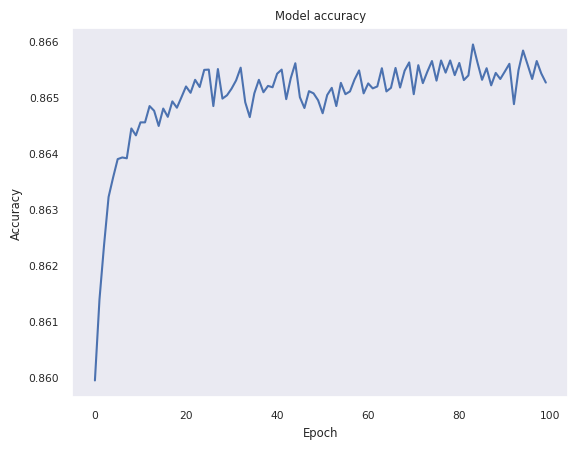

------------------
Training and Validation accuracy'
------------------


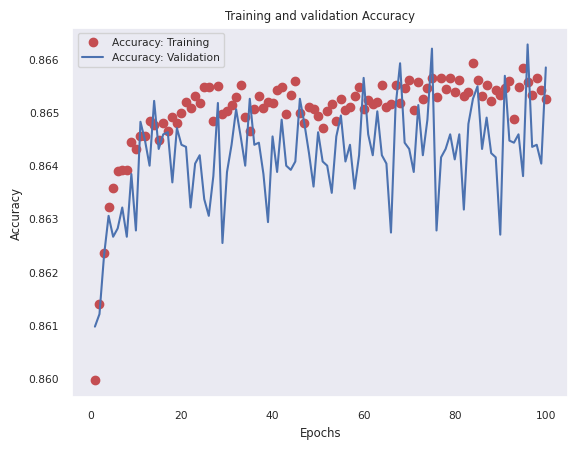

In [100]:
acc = history_drop.history['accuracy']
val_acc = history_drop.history['val_accuracy']
loss = history_drop.history['loss']
val_loss = history_drop.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


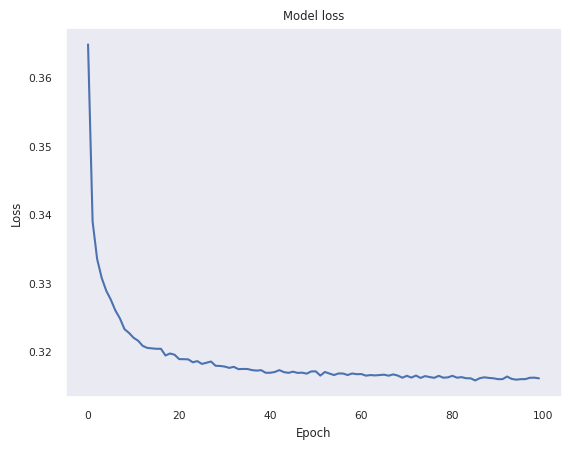

------------------
Training and Validation loss
------------------


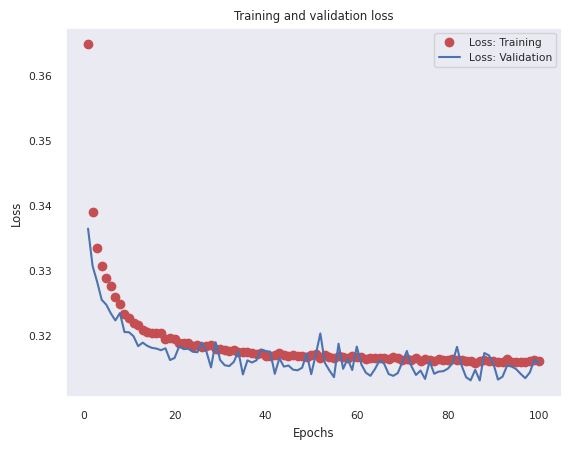

In [101]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [102]:
# plot results
print("------------------")
print("RESULTS")
rmsprop_test_loss, rmsprop_test_acc = network_drop.evaluate(x_test, y_test)
print(f'test_loss: {rmsprop_test_loss}')
print(f'test_acc: {rmsprop_test_acc}')
print("------------------")
rmsprop_results = network_drop.evaluate(x_test, y_test)
rmsprop_results
print("------------------")

------------------
RESULTS
793/793 [==============================] - 1s 1ms/step - loss: 0.3179 - accuracy: 0.8647
test_loss: 0.31791558861732483
test_acc: 0.8646720051765442
------------------
793/793 [==============================] - 1s 1ms/step - loss: 0.3179 - accuracy: 0.8647
------------------


In [103]:
# Add in a dropout layer after each layer
network_drop1 = models.Sequential([layers.Dense(8,
                                                activation='relu',
                                                input_shape=(21,)),
                                   layers.Dropout(0.05),
                                   layers.Dense(12, activation="relu"),
                                   layers.Dropout(0.05),
                                   layers.Dense(16, activation="relu"),
                                   layers.Dropout(0.05),
                                   layers.Dense(2, activation='softmax')]
                                  )
# sample_weight_mode = 0.001
network_drop1.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])

init_weights = network_drop1.get_weights()
history_drop1 = network_drop1.fit(x_train,
                                  y_train,
                                  epochs=100,
                                  batch_size=256,
                                  validation_data=(x_val, y_val))

Epoch 1/100
793/793 [==============================] - 4s 3ms/step - loss: 0.3871 - accuracy: 0.8492 - val_loss: 0.3376 - val_accuracy: 0.8607
Epoch 2/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3381 - accuracy: 0.8608 - val_loss: 0.3321 - val_accuracy: 0.8607
Epoch 3/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3332 - accuracy: 0.8608 - val_loss: 0.3299 - val_accuracy: 0.8607
Epoch 4/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3315 - accuracy: 0.8608 - val_loss: 0.3287 - val_accuracy: 0.8607
Epoch 5/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3300 - accuracy: 0.8608 - val_loss: 0.3281 - val_accuracy: 0.8607
Epoch 6/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3283 - accuracy: 0.8608 - val_loss: 0.3254 - val_accuracy: 0.8607
Epoch 7/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3274 - accuracy: 0.8608 - val_loss: 0.3272 - val_accuracy: 0.8607

------------------
Model accuracy
------------------


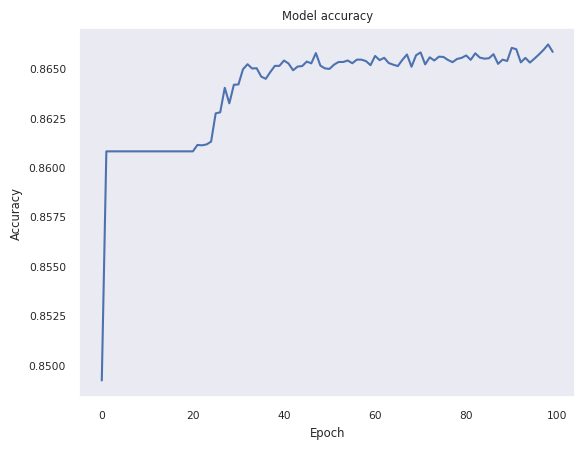

------------------
Training and Validation accuracy'
------------------


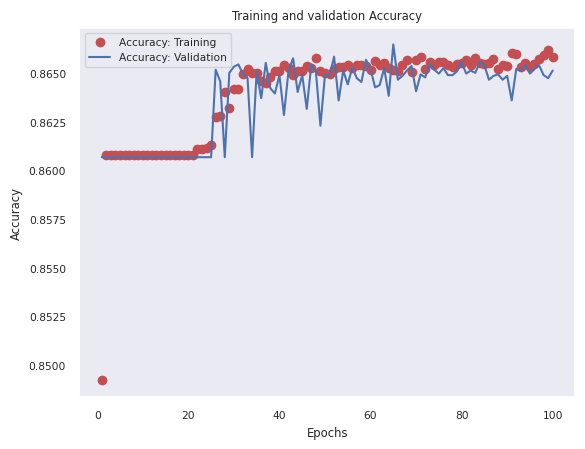

In [104]:
acc = history_drop1.history['accuracy']
val_acc = history_drop1.history['val_accuracy']
loss = history_drop1.history['loss']
val_loss = history_drop1.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop1.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


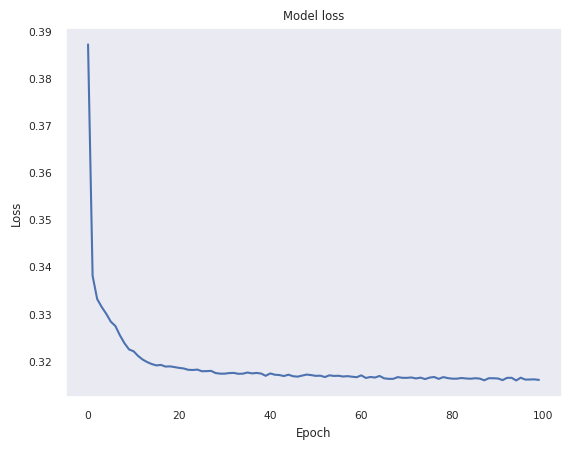

------------------
Training and Validation loss
------------------


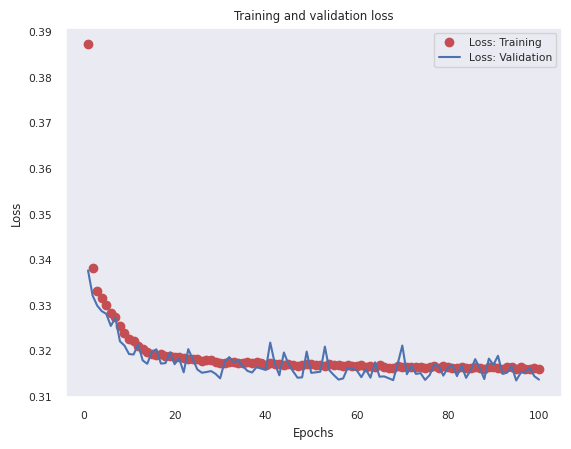

In [105]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop1.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [106]:
# plot results
print("------------------")
print("RESULTS")
adam_test_loss, adam_test_acc = network_drop1.evaluate(x_test, y_test)
print(f'test_loss: {adam_test_loss}')
print(f'test_acc: {adam_test_acc}')
print("------------------")
adam_results = network_drop1.evaluate(x_test, y_test)
adam_results
print("------------------")

------------------
RESULTS
793/793 [==============================] - 1s 1ms/step - loss: 0.3156 - accuracy: 0.8651
test_loss: 0.3156161606311798
test_acc: 0.8650662302970886
------------------
793/793 [==============================] - 1s 1ms/step - loss: 0.3156 - accuracy: 0.8651
------------------


In [107]:
# Add in a dropout layer after each layer
network_drop2 = models.Sequential([layers.Dense(8,
                                                activation='relu',
                                                input_shape=(21,)),
                                   layers.Dropout(0.05),
                                   layers.Dense(12, activation="relu"),
                                   layers.Dropout(0.05),
                                   layers.Dense(16, activation="relu"),
                                   layers.Dropout(0.05),
                                   layers.Dense(2, activation='softmax')]
                                  )
# sample_weight_mode = 0.001
network_drop2.compile(optimizer="AdaDelta",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])

init_weights = network_drop2.get_weights()
history_drop2 = network_drop2.fit(x_train,
                                  y_train,
                                  epochs=100,
                                  batch_size=256,
                                  validation_data=(x_val, y_val))

Epoch 1/100
793/793 [==============================] - 3s 3ms/step - loss: 1.5598 - accuracy: 0.1616 - val_loss: 1.4135 - val_accuracy: 0.1393
Epoch 2/100
793/793 [==============================] - 2s 3ms/step - loss: 1.4054 - accuracy: 0.1722 - val_loss: 1.2551 - val_accuracy: 0.1393
Epoch 3/100
793/793 [==============================] - 2s 3ms/step - loss: 1.2377 - accuracy: 0.1825 - val_loss: 1.0957 - val_accuracy: 0.1393
Epoch 4/100
793/793 [==============================] - 2s 3ms/step - loss: 1.0773 - accuracy: 0.1948 - val_loss: 0.9499 - val_accuracy: 0.1403
Epoch 5/100
793/793 [==============================] - 2s 3ms/step - loss: 0.9359 - accuracy: 0.2237 - val_loss: 0.8243 - val_accuracy: 0.1607
Epoch 6/100
793/793 [==============================] - 2s 3ms/step - loss: 0.8163 - accuracy: 0.3032 - val_loss: 0.7195 - val_accuracy: 0.3357
Epoch 7/100
793/793 [==============================] - 2s 3ms/step - loss: 0.7162 - accuracy: 0.5431 - val_loss: 0.6335 - val_accuracy: 0.8339

------------------
Model accuracy
------------------


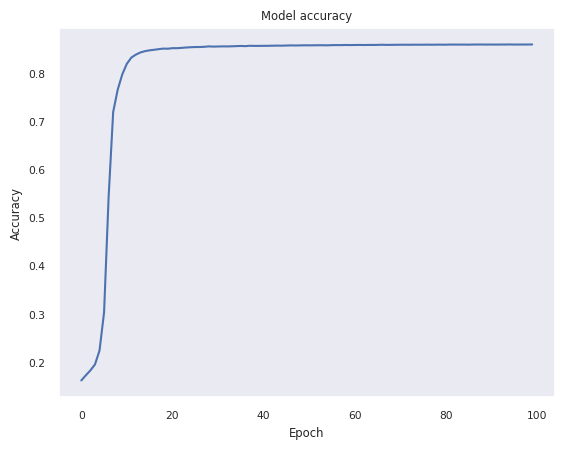

------------------
Training and Validation accuracy'
------------------


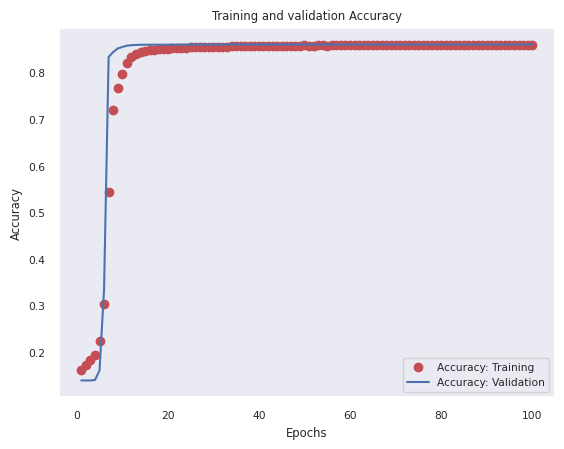

In [108]:
acc = history_drop2.history['accuracy']
val_acc = history_drop2.history['val_accuracy']
loss = history_drop2.history['loss']
val_loss = history_drop2.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop2.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


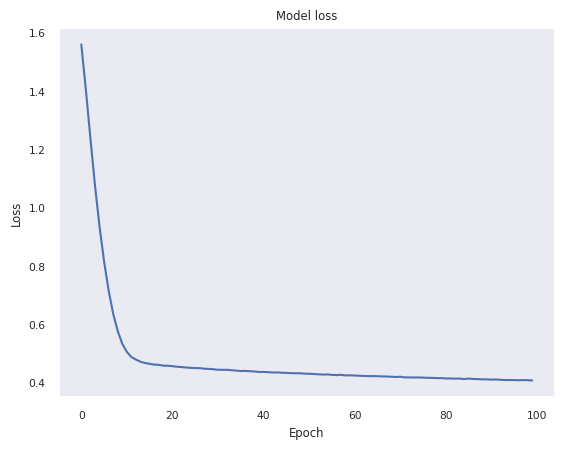

------------------
Training and Validation loss
------------------


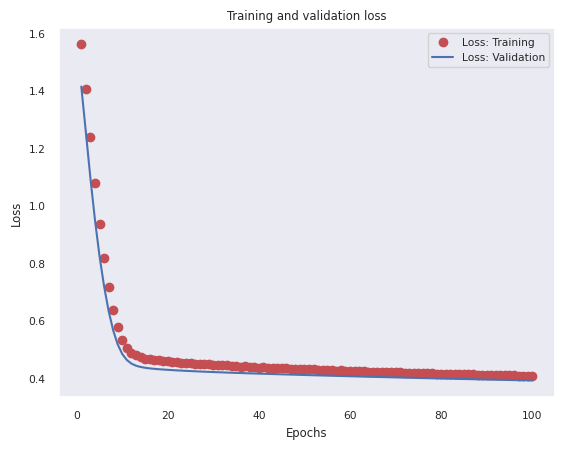

In [109]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop2.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [110]:
# plot results
print("------------------")
print("RESULTS")
AdaDelta_test_loss, AdaDelta_test_acc = network_drop2.evaluate(x_test, y_test)
print(f'test_loss: {AdaDelta_test_loss}')
print(f'test_acc: {AdaDelta_test_acc}')
print("------------------")
AdaDelta_results = network_drop2.evaluate(x_test, y_test)
AdaDelta_results
print("------------------")

------------------
RESULTS
793/793 [==============================] - 1s 1ms/step - loss: 0.3916 - accuracy: 0.8595
test_loss: 0.39155957102775574
test_acc: 0.8595080375671387
------------------
793/793 [==============================] - 1s 1ms/step - loss: 0.3916 - accuracy: 0.8595
------------------


In [111]:
# Add in a dropout layer after each layer
network_drop3 = models.Sequential([layers.Dense(8,
                                                activation='relu',
                                                input_shape=(21,)),
                                   layers.Dropout(0.05),
                                   layers.Dense(12, activation="relu"),
                                   layers.Dropout(0.05),
                                   layers.Dense(16, activation="relu"),
                                   layers.Dropout(0.05),
                                   layers.Dense(2, activation='softmax')]
                                  )
# sample_weight_mode = 0.001
network_drop3.compile(optimizer="SGD",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])

init_weights = network_drop3.get_weights()
history_drop3 = network_drop3.fit(x_train,
                                  y_train,
                                  epochs=100,
                                  batch_size=256,
                                  validation_data=(x_val, y_val))

Epoch 1/100
793/793 [==============================] - 3s 3ms/step - loss: 0.4075 - accuracy: 0.8569 - val_loss: 0.3663 - val_accuracy: 0.8607
Epoch 2/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3701 - accuracy: 0.8608 - val_loss: 0.3546 - val_accuracy: 0.8607
Epoch 3/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3596 - accuracy: 0.8608 - val_loss: 0.3464 - val_accuracy: 0.8607
Epoch 4/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3536 - accuracy: 0.8607 - val_loss: 0.3437 - val_accuracy: 0.8607
Epoch 5/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3504 - accuracy: 0.8607 - val_loss: 0.3402 - val_accuracy: 0.8606
Epoch 6/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3470 - accuracy: 0.8605 - val_loss: 0.3377 - val_accuracy: 0.8605
Epoch 7/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3449 - accuracy: 0.8605 - val_loss: 0.3401 - val_accuracy: 0.8607

------------------
Model accuracy
------------------


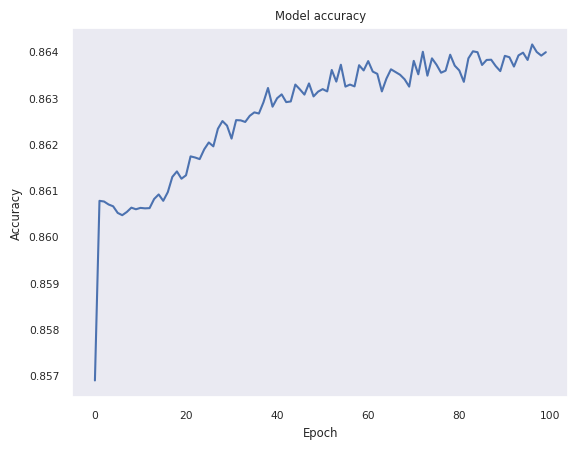

------------------
Training and Validation accuracy'
------------------


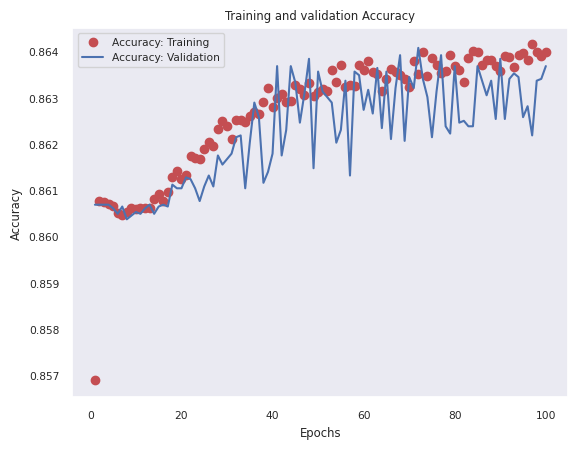

In [112]:
acc = history_drop3.history['accuracy']
val_acc = history_drop3.history['val_accuracy']
loss = history_drop3.history['loss']
val_loss = history_drop3.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop3.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


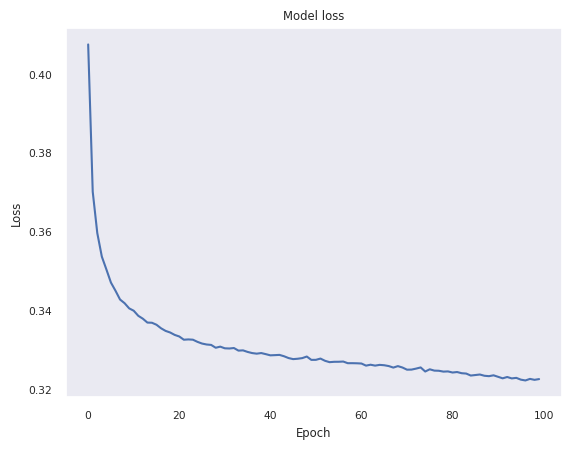

------------------
Training and Validation loss
------------------


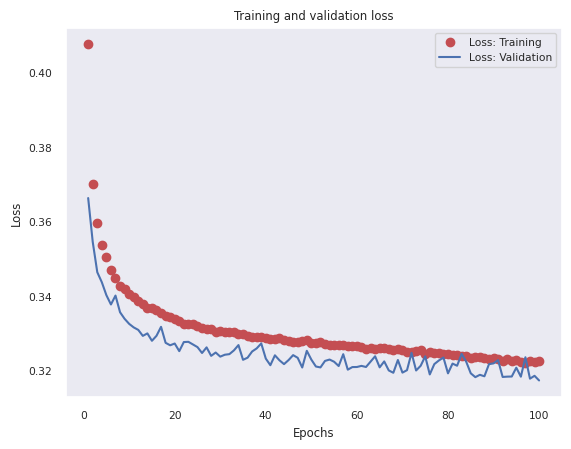

In [113]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop3.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [114]:
# plot results
print("------------------")
print("RESULTS")
SGD_test_loss, SGD_test_acc = network_drop3.evaluate(x_test, y_test)
print(f'test_loss: {SGD_test_loss}')
print(f'test_acc: {SGD_test_acc}')
print("------------------")
SGD_results = network_drop3.evaluate(x_test, y_test)
SGD_results
print("------------------")

------------------
RESULTS
793/793 [==============================] - 1s 1ms/step - loss: 0.3187 - accuracy: 0.8635
test_loss: 0.31872281432151794
test_acc: 0.8634894490242004
------------------
793/793 [==============================] - 1s 2ms/step - loss: 0.3187 - accuracy: 0.8635
------------------


In [115]:
# Add in a dropout layer after each layer
AdaGrad_network_drop = models.Sequential([layers.Dense(8,
                                                       activation='relu',
                                                       input_shape=(21,)),
                                          layers.Dropout(0.05),
                                          layers.Dense(12, activation="relu"),
                                          layers.Dropout(0.05),
                                          layers.Dense(16, activation="relu"),
                                          layers.Dropout(0.05),
                                          layers.Dense(2,
                                                       activation='softmax')]
                                         )
# sample_weight_mode = 0.001
AdaGrad_network_drop.compile(optimizer="AdaGrad",
                             loss="sparse_categorical_crossentropy",
                             metrics=["accuracy"])

AdaGrad_init_weights = AdaGrad_network_drop.get_weights()
AdaGrad_history_drop = AdaGrad_network_drop.fit(x_train,
                                                y_train,
                                                epochs=100,
                                                batch_size=256,
                                                validation_data=(x_val,
                                                                 y_val))

Epoch 1/100
793/793 [==============================] - 3s 3ms/step - loss: 0.5218 - accuracy: 0.8502 - val_loss: 0.4271 - val_accuracy: 0.8599
Epoch 2/100
793/793 [==============================] - 2s 3ms/step - loss: 0.4605 - accuracy: 0.8494 - val_loss: 0.4152 - val_accuracy: 0.8607
Epoch 3/100
793/793 [==============================] - 2s 3ms/step - loss: 0.4469 - accuracy: 0.8524 - val_loss: 0.4091 - val_accuracy: 0.8607
Epoch 4/100
793/793 [==============================] - 2s 3ms/step - loss: 0.4381 - accuracy: 0.8541 - val_loss: 0.4045 - val_accuracy: 0.8607
Epoch 5/100
793/793 [==============================] - 2s 3ms/step - loss: 0.4320 - accuracy: 0.8549 - val_loss: 0.4011 - val_accuracy: 0.8606
Epoch 6/100
793/793 [==============================] - 2s 3ms/step - loss: 0.4252 - accuracy: 0.8558 - val_loss: 0.3978 - val_accuracy: 0.8606
Epoch 7/100
793/793 [==============================] - 2s 3ms/step - loss: 0.4227 - accuracy: 0.8570 - val_loss: 0.3953 - val_accuracy: 0.8606

------------------
Model accuracy AdaGrad
------------------


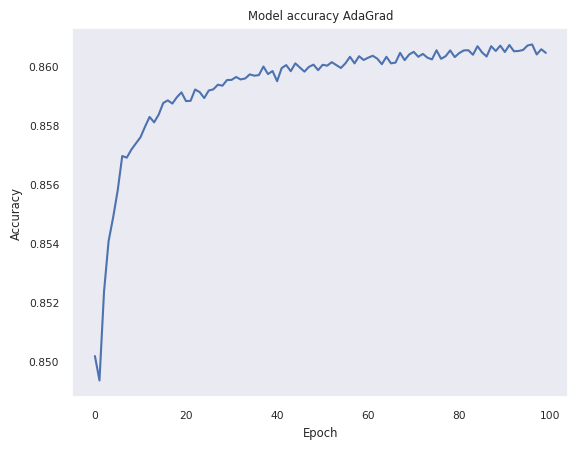

------------------
Training and Validation accuracy'
------------------


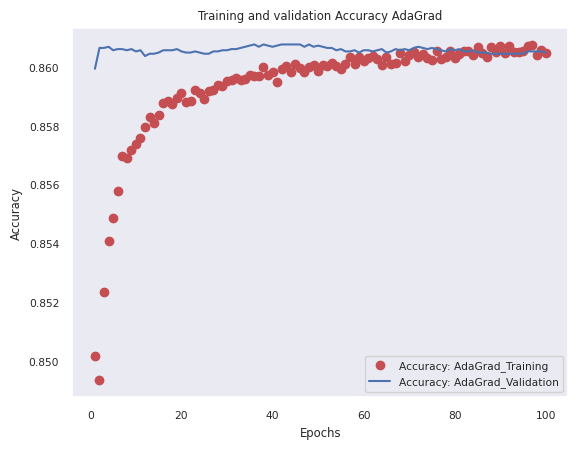

In [116]:
AdaGrad_acc = AdaGrad_history_drop.history['accuracy']
AdaGrad_val_acc = AdaGrad_history_drop.history['val_accuracy']
AdaGrad_loss = AdaGrad_history_drop.history['loss']
AdaGrad_val_loss = AdaGrad_history_drop.history['val_loss']
AdaGrad_epochs = range(1, len(AdaGrad_acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy AdaGrad")
print("------------------")

plt.plot(AdaGrad_history_drop.history['accuracy'])
plt.title('Model accuracy AdaGrad')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(AdaGrad_epochs, AdaGrad_acc, 'ro', label='Accuracy: AdaGrad_Training')
plt.plot(AdaGrad_epochs, AdaGrad_val_acc, 'b',
         label='Accuracy: AdaGrad_Validation')
plt.title('Training and validation Accuracy AdaGrad')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss AdaGrad
------------------


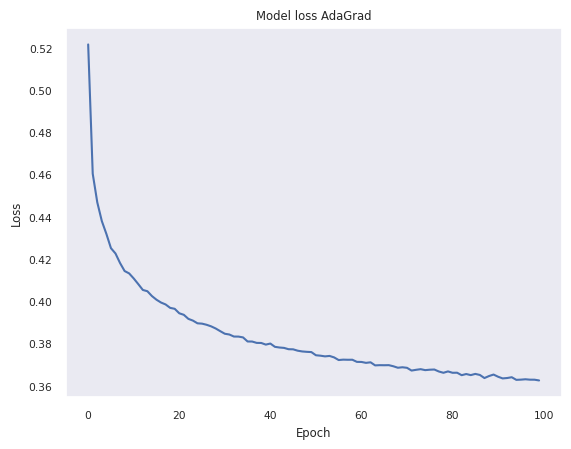

------------------
Training and Validation loss AdaGrad
------------------


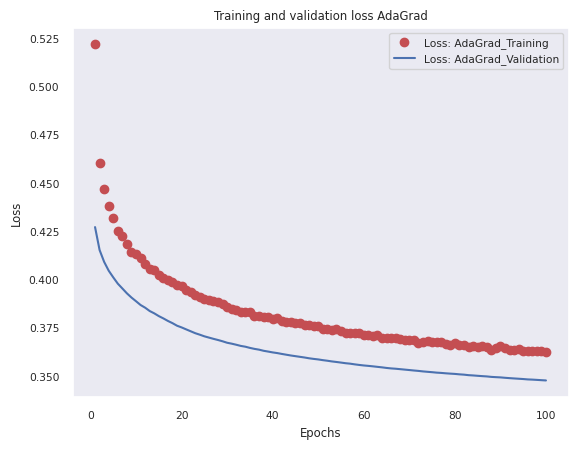

In [117]:
# Plot training loss values
print("------------------")
print("Model loss AdaGrad")
print("------------------")
plt.plot(AdaGrad_history_drop.history['loss'])
plt.title('Model loss AdaGrad')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss AdaGrad")
print("------------------")
plt.plot(AdaGrad_epochs, AdaGrad_loss, 'ro', label='Loss: AdaGrad_Training')
plt.plot(AdaGrad_epochs, AdaGrad_val_loss, 'b',
         label='Loss: AdaGrad_Validation')
plt.title('Training and validation loss AdaGrad')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [118]:
# plot results
print("------------------")
print("RESULTS")
AdaGrad_test_loss, AdaGrad_test_acc = AdaGrad_network_drop.evaluate(x_test,
                                                                    y_test)
print(f'test_loss: {AdaGrad_test_loss}')
print(f'test_acc: {AdaGrad_test_acc}')
print("------------------")
AdaGrad_results = AdaGrad_network_drop.evaluate(x_test, y_test)
AdaGrad_results
print("------------------")

------------------
RESULTS
793/793 [==============================] - 1s 1ms/step - loss: 0.3498 - accuracy: 0.8595
test_loss: 0.34983983635902405
test_acc: 0.8594686388969421
------------------
793/793 [==============================] - 1s 1ms/step - loss: 0.3498 - accuracy: 0.8595
------------------


In [119]:
print("------------------")
print("RESULTS")
results
print("------------------")
print(f'test_loss: {test_loss}')
print(f'test_acc: {test_acc}')
print("------------------")
print("RESULTS - RMS Prop")
rmsprop_results
print("------------------")
print(f'test_loss: {rmsprop_test_loss}')
print(f'test_acc: {rmsprop_test_acc}')
print("------------------")
print("RESULTS - Adam")
adam_results
print("------------------")
print(f'test_loss: {adam_test_loss}')
print(f'test_acc: {adam_test_acc}')
print("------------------")
print("RESULTS - AdaDelta")
AdaDelta_results
print("------------------")
print(f'test_loss: {AdaDelta_test_loss}')
print(f'test_acc: {AdaDelta_test_acc}')
print("------------------")
print("RESULTS - SGD")
SGD_results
print("------------------")
print(f'test_loss: {SGD_test_loss}')
print(f'test_acc: {SGD_test_acc}')
print("------------------")
print("RESULTS - AdaGrad")
AdaGrad_results
print("------------------")
print(f'test_loss: {AdaGrad_test_loss}')
print(f'test_acc: {AdaGrad_test_acc}')

------------------
RESULTS
------------------
test_loss: 0.31525808572769165
test_acc: 0.8647902607917786
------------------
RESULTS - RMS Prop
------------------
test_loss: 0.31791558861732483
test_acc: 0.8646720051765442
------------------
RESULTS - Adam
------------------
test_loss: 0.3156161606311798
test_acc: 0.8650662302970886
------------------
RESULTS - AdaDelta
------------------
test_loss: 0.39155957102775574
test_acc: 0.8595080375671387
------------------
RESULTS - SGD
------------------
test_loss: 0.31872281432151794
test_acc: 0.8634894490242004
------------------
RESULTS - AdaGrad
------------------
test_loss: 0.34983983635902405
test_acc: 0.8594686388969421


In [154]:
results_data = {'optimiser': ["results", "RMS_prop", "adam", "adadelta",
                              "SGD", "adagrad"],
                'test loss': [test_loss, rmsprop_test_loss, adam_test_loss,
                              AdaDelta_test_loss, SGD_test_loss,
                              AdaGrad_test_loss],
                'test accuracy': [test_acc, rmsprop_test_acc, adam_test_acc,
                                  AdaDelta_test_acc, SGD_test_acc,
                                  AdaGrad_test_acc]}

results_data = pd.DataFrame(results_data)
results_data.sort_values(ascending=False, by='test accuracy')

,optimiser,test loss,test accuracy
2,adam,0.315616,0.865066
0,results,0.315258,0.864790
1,RMS_prop,0.317916,0.864672
4,SGD,0.318723,0.863489
3,adadelta,0.391560,0.859508
5,adagrad,0.349840,0.859469


In [128]:
correl_abs.sort_values(ascending=False).head(6)

Diabetes_binary    1.000000
GenHlth            0.293569
HighBP             0.263129
DiffWalk           0.218344
BMI                0.216843
HighChol           0.200276
Name: Diabetes_binary, dtype: float64

In [129]:
vals.sort_values('F_Value', ascending=False).head(5)

,F_Value,Statistic
DiffWalk,4.376083e-179,8.148714e+02
HighBP,0.000000e+00,5.833612e+04
HighChol,0.000000e+00,5.649804e+04
Age,0.000000e+00,1.672625e+06
Sex,0.000000e+00,6.273870e+04


In [132]:
X2 = X[['DiffWalk', 'HighBP', 'HighChol', 'Age', 'Sex']].copy()

In [133]:
# Split the training set - 80% Train, 20% Test/Validation (so 80/10/10)
# Split off the test and training set
x_train, x_test, y_train, y_test = train_test_split(X2, y,
                                                    test_size=0.1,
                                                    shuffle=True)

# Split off to get the validation sets
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                  test_size=1/9)
print("Test, train and validation sets created")

print("The shape of the data are:")
# Check the shapes are actually correct:
print("X_train shape: {}".format(x_train.shape))
print("y_train shape: {}".format(y_train.shape))

print("X_test shape: {}".format(x_test.shape))
print("y_test shape: {}".format(y_test.shape))

print("X_val shape: {}".format(x_val.shape))
print("y val shape: {}".format(y_val.shape))
print("------------------")

print("Converting to tensorflow")
x_train = tf.convert_to_tensor(x_train)
x_test = tf.convert_to_tensor(x_test)
y_train = tf.convert_to_tensor(y_train)
y_test = tf.convert_to_tensor(y_test)
x_val = tf.convert_to_tensor(x_val)
y_val = tf.convert_to_tensor(y_val)

print("Converted to tensorflow")
print("------------------")
print("The shape of the data are:")

print("X_train shape: {}".format(x_train.shape))
print("y_train shape: {}".format(y_train.shape))

print("X_test shape: {}".format(x_test.shape))
print("y_test shape: {}".format(y_test.shape))

print("X_val shape: {}".format(x_val.shape))
print("y val shape: {}".format(y_val.shape))
print("------------------")
print("The data has been preprocessed")

Test, train and validation sets created
The shape of the data are:
X_train shape: (202944, 5)
y_train shape: (202944, 1)
X_test shape: (25368, 5)
y_test shape: (25368, 1)
X_val shape: (25368, 5)
y val shape: (25368, 1)
------------------
Converting to tensorflow
Converted to tensorflow
------------------
The shape of the data are:
X_train shape: (202944, 5)
y_train shape: (202944, 1)
X_test shape: (25368, 5)
y_test shape: (25368, 1)
X_val shape: (25368, 5)
y val shape: (25368, 1)
------------------
The data has been preprocessed


In [135]:
# Add in a dropout layer after each layer
network_adam_5 = models.Sequential([layers.Dense(8,
                                                 activation='relu',
                                                 input_shape=(21,)),
                                    layers.Dropout(0.05),
                                    layers.Dense(12, activation="relu"),
                                    layers.Dropout(0.05),
                                    layers.Dense(16, activation="relu"),
                                    layers.Dropout(0.05),
                                    layers.Dense(2, activation='softmax')]
                                   )
# sample_weight_mode = 0.001
network_adam_5.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy"])

init_weights = network_adam_5.get_weights()
history_drop_adam = network_adam_5.fit(x_train,
                                       y_train,
                                       epochs=100,
                                       batch_size=256,
                                       validation_data=(x_val, y_val))

Epoch 1/100
793/793 [==============================] - 3s 3ms/step - loss: 0.4107 - accuracy: 0.8390 - val_loss: 0.3508 - val_accuracy: 0.8618
Epoch 2/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3557 - accuracy: 0.8604 - val_loss: 0.3478 - val_accuracy: 0.8618
Epoch 3/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3520 - accuracy: 0.8607 - val_loss: 0.3470 - val_accuracy: 0.8618
Epoch 4/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3498 - accuracy: 0.8607 - val_loss: 0.3467 - val_accuracy: 0.8618
Epoch 5/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3485 - accuracy: 0.8608 - val_loss: 0.3459 - val_accuracy: 0.8618
Epoch 6/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3478 - accuracy: 0.8607 - val_loss: 0.3469 - val_accuracy: 0.8618
Epoch 7/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3474 - accuracy: 0.8608 - val_loss: 0.3469 - val_accuracy: 0.8618

------------------
Model accuracy
------------------


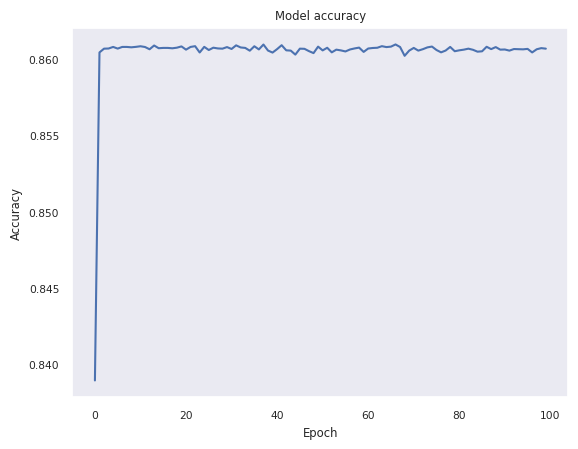

------------------
Training and Validation accuracy'
------------------


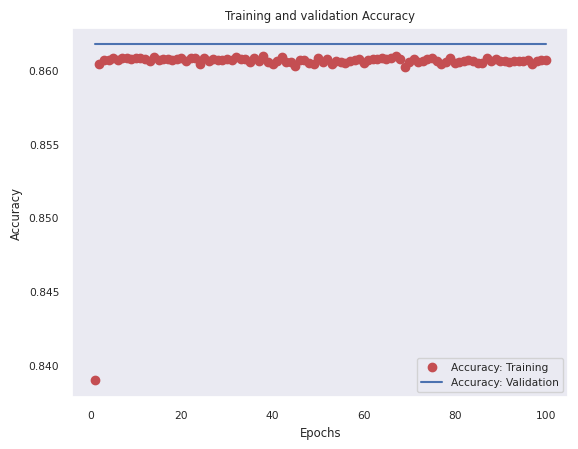

In [140]:
acc = history_drop_adam.history['accuracy']
val_acc = history_drop_adam.history['val_accuracy']
loss = history_drop_adam.history['loss']
val_loss = history_drop_adam.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop_adam.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


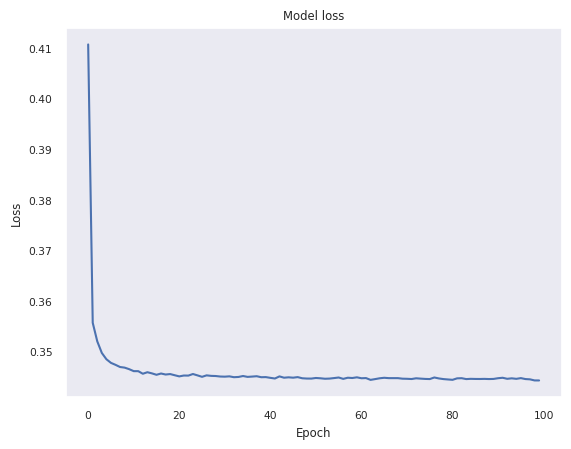

------------------
Training and Validation loss
------------------


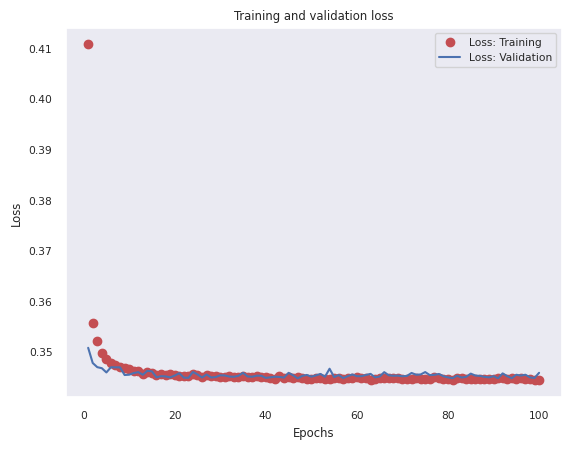

In [137]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop_adam.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [138]:
# plot results
print("------------------")
print("RESULTS")
adam_5_test_loss, adam_5_test_acc = network_adam_5.evaluate(x_test, y_test)
print(f'test_loss: {adam_5_test_loss}')
print(f'test_acc: {adam_5_test_acc}')
print("------------------")
adam_5_results = network_adam_5.evaluate(x_test, y_test)
adam_5_results
print("------------------")

------------------
RESULTS
793/793 [==============================] - 1s 1ms/step - loss: 0.3512 - accuracy: 0.8581
test_loss: 0.35115641355514526
test_acc: 0.8580889105796814
------------------
793/793 [==============================] - 1s 1ms/step - loss: 0.3512 - accuracy: 0.8581
------------------


In [146]:
# Add in a dropout layer after each layer
network_adam_6 = models.Sequential([layers.Dense(8,
                                                 activation='relu',
                                                 input_shape=(21,)),
                                    layers.Dropout(0.05),
                                    layers.Dense(12, activation="relu"),
                                    layers.Dropout(0.05),
                                    layers.Dense(16, activation="relu"),
                                    layers.Dropout(0.05),
                                    layers.Dense(2, activation='softmax')]
                                   )
# sample_weight_mode = 0.001
network_adam_6.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy"])

init_weights = network_adam_6.get_weights()
history_drop_adam6 = network_adam_6.fit(x_train,
                                        y_train,
                                        epochs=100,
                                        batch_size=256,
                                        validation_data=(x_val, y_val))

Epoch 1/100
793/793 [==============================] - 3s 3ms/step - loss: 0.4059 - accuracy: 0.8540 - val_loss: 0.3529 - val_accuracy: 0.8618
Epoch 2/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3567 - accuracy: 0.8608 - val_loss: 0.3481 - val_accuracy: 0.8618
Epoch 3/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3518 - accuracy: 0.8607 - val_loss: 0.3469 - val_accuracy: 0.8618
Epoch 4/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3502 - accuracy: 0.8607 - val_loss: 0.3462 - val_accuracy: 0.8618
Epoch 5/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3498 - accuracy: 0.8607 - val_loss: 0.3460 - val_accuracy: 0.8618
Epoch 6/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3487 - accuracy: 0.8608 - val_loss: 0.3462 - val_accuracy: 0.8618
Epoch 7/100
793/793 [==============================] - 2s 3ms/step - loss: 0.3485 - accuracy: 0.8608 - val_loss: 0.3462 - val_accuracy: 0.8618

------------------
Model accuracy
------------------


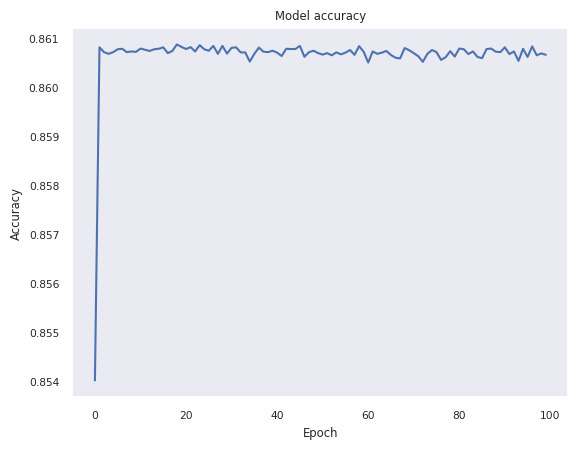

------------------
Training and Validation accuracy'
------------------


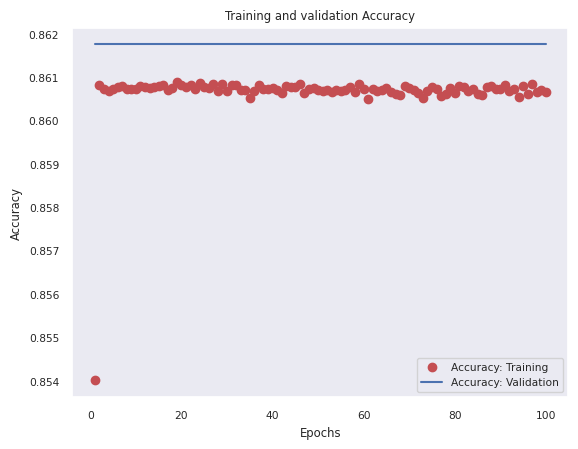

In [147]:
acc = history_drop_adam6.history['accuracy']
val_acc = history_drop_adam6.history['val_accuracy']
loss = history_drop_adam6.history['loss']
val_loss = history_drop_adam6.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop_adam6.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


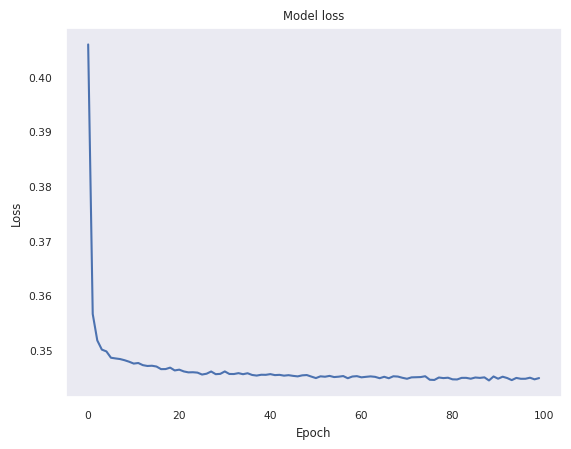

------------------
Training and Validation loss
------------------


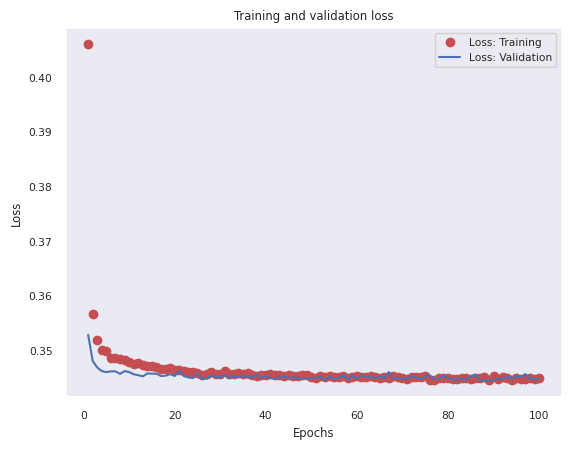

In [148]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop_adam6.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [149]:
# plot results
print("------------------")
print("RESULTS")
adam_6_test_loss, adam_6_test_acc = network_adam_6.evaluate(x_test, y_test)
print(f'test_loss: {adam_6_test_loss}')
print(f'test_acc: {adam_6_test_acc}')
print("------------------")
adam_6_results = network_adam_6.evaluate(x_test, y_test)
adam_6_results
print("------------------")

------------------
RESULTS
793/793 [==============================] - 1s 1ms/step - loss: 0.3502 - accuracy: 0.8581
test_loss: 0.35023632645606995
test_acc: 0.8580889105796814
------------------
793/793 [==============================] - 1s 1ms/step - loss: 0.3502 - accuracy: 0.8581
------------------


In [155]:
results_data_2 = {'optimiser': ["adam", "adam_5", "adam_6"],
                  'test loss': [adam_test_loss, adam_5_test_loss,
                                adam_6_test_loss],
                  'test accuracy': [adam_test_acc, adam_5_test_acc,
                                    adam_6_test_acc]}

results_data_2 = pd.DataFrame(results_data_2)
results_data_2.sort_values(ascending=False, by='test accuracy')

,optimiser,test loss,test accuracy
0,adam,0.315616,0.865066
1,adam_5,0.351156,0.858089
2,adam_6,0.350236,0.858089
